<img src="header.jpg" />

# Imports

In [1]:
# Math & data
import numpy as np
import pandas as pd
from datetime import date
import itertools

# Graphics
import matplotlib.pyplot as plt
import seaborn as sns

import copy

c:\users\public\wpython\v_3.7.6\soft\python-3.7.6.amd64\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
from collections import Counter

In [3]:
# Pre-processing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Feature selection
from sklearn.model_selection import GridSearchCV, KFold

# ML
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB, ComplementNB
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc, roc_auc_score, f1_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.metrics import make_scorer
from sklearn.metrics import classification_report

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE, SMOTENC, BorderlineSMOTE, SVMSMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbPipeline

In [4]:
import joblib

In [5]:
import re

In [6]:
# Modules perso
%load_ext autoreload
# %reload_ext autoreload
%autoreload 2

In [7]:
import DisplotData, DisplotML, PwePwocess, Funktiuns
from DisplotData import bcolors
import MLstuff

In [8]:
pd.set_option("display.max_columns", 150) # None

# Premiers modèles 

## Variables : toutes

In [392]:
submission_file_name = "submission_kernel02.csv"

In [393]:
debug = False
df_prep, cat_cols, num_cols = preprocess(selected_features=None, debug=debug)

Train samples: 307511, test samples: 48744
bb_cat 1 = ['STATUS__0', 'STATUS__1', 'STATUS__2', 'STATUS__3', 'STATUS__4', 'STATUS__5', 'STATUS__C', 'STATUS__X', 'STATUS__nan']
bb_cat 2 = ['STATUS__0', 'STATUS__1', 'STATUS__2', 'STATUS__3', 'STATUS__4', 'STATUS__5', 'STATUS__C', 'STATUS__X', 'STATUS__nan']
ON PASSE BIEN ICI
bureau.shape = (1716428, 51)
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 26s
Previous applications df shape: (338858, 249)
Process previous_applications - done in 29s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 13s
Installments payments df shape: (339585, 26)
Process installments payments - done in 35s
Credit card balance df shape: (103558, 141)
Process credit card balance - done in 30s


In [402]:
debug = True
df_prep_3000, cat_cols, num_cols = preprocess(selected_features=None, debug=debug)

Train samples: 3000, test samples: 3000
bb_cat 1 = ['STATUS__0', 'STATUS__1', 'STATUS__2', 'STATUS__3', 'STATUS__4', 'STATUS__5', 'STATUS__C', 'STATUS__X', 'STATUS__nan']
bb_cat 2 = ['STATUS__0', 'STATUS__1', 'STATUS__2', 'STATUS__3', 'STATUS__4', 'STATUS__5', 'STATUS__C', 'STATUS__X', 'STATUS__nan']
ON PASSE BIEN ICI
bureau.shape = (1716428, 51)
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 26s
Previous applications df shape: (338858, 249)
Process previous_applications - done in 28s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 12s
Installments payments df shape: (339585, 26)
Process installments payments - done in 30s
Credit card balance df shape: (103558, 141)
Process credit card balance - done in 17s


In [407]:
debug = False
df_prep_10000, cat_cols, num_cols = preprocess(selected_features=None, debug=debug, num_rows=10000)

Train samples: 10000, test samples: 10000
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 23s
Previous applications df shape: (338858, 249)
Process previous_applications - done in 27s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 11s
Installments payments df shape: (339585, 26)
Process installments payments - done in 28s
Credit card balance df shape: (103558, 141)
Process credit card balance - done in 16s


### RandomForest

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run RandomForest"):
    feat_importance_rf, train_df_rf, test_df_rf = kfold_algo(df_prep, cat_cols, num_cols, algo_name='RandomForest', n_folds=5, stratified=True, debug=debug)
%store feat_importance_rf
%store train_df_rf
%store test_df_rf

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run RandomForest"):
    feat_importance_rf_10000, train_df_rf_10000, test_df_rf_10000 = kfold_algo(df_prep_10000, cat_cols, num_cols, algo_name='RandomForest', n_folds=5, stratified=True, debug=debug)
%store feat_importance_rf_10000
%store train_df_rf_10000
%store test_df_rf_10000

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run RandomForest"):
    feat_importance_rf_3000, train_df_rf_3000, test_df_rf_3000 = kfold_algo(df_prep_3000, cat_cols, num_cols, algo_name='RandomForest', n_folds=5, stratified=True, debug=debug)
%store feat_importance_rf_3000
%store train_df_rf_3000
%store test_df_rf_3000

### XGBoost

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run XGBoost"):
    feat_importance_xgb, train_df_xgb, test_df_xgb = kfold_algo(df_prep, cat_cols, num_cols, algo_name='XGBoost', n_folds=5, stratified=True, debug=debug)
%store feat_importance_xgb
%store train_df_xgb
%store test_df_xgb

#### 10000 points

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run XGBoost"):
    feat_importance_xgb_10000, train_df_xgb_10000, test_df_xgb_10000 = kfold_algo(df_prep_10000, cat_cols, num_cols, algo_name='XGBoost', n_folds=5, stratified=True, debug=debug)
%store feat_importance_xgb_10000
%store train_df_xgb_10000
%store test_df_xgb_10000

#### 3000 points

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run XGBoost"):
    feat_importance_xgb_3000, train_df_xgb_3000, test_df_xgb_3000 = kfold_algo(df_prep_3000, cat_cols, num_cols, algo_name='XGBoost', n_folds=5, stratified=True, debug=debug)
%store feat_importance_xgb_3000
%store train_df_xgb_3000
%store test_df_xgb_3000

In [440]:
df_prep_3000.shape

(6000, 795)

In [435]:
df_prep_3000.columns

Index(['index', 'SK_ID_CURR', 'TARGET', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY',
       ...
       'CC%NAME_CONTRACT_STATUS__Signed#MAX',
       'CC%NAME_CONTRACT_STATUS__Signed#MEAN',
       'CC%NAME_CONTRACT_STATUS__Signed#SUM',
       'CC%NAME_CONTRACT_STATUS__Signed#VAR',
       'CC%NAME_CONTRACT_STATUS__nan#MIN', 'CC%NAME_CONTRACT_STATUS__nan#MAX',
       'CC%NAME_CONTRACT_STATUS__nan#MEAN', 'CC%NAME_CONTRACT_STATUS__nan#SUM',
       'CC%NAME_CONTRACT_STATUS__nan#VAR', 'CC%COUNT_NR'],
      dtype='object', length=795)

### LightGBM

Starting LightGBM. Train shape: (307507, 798), test shape: (48744, 798)


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797087	training's binary_logloss: 0.235295	valid_1's auc: 0.768136	valid_1's binary_logloss: 0.244041
[400]	training's auc: 0.819751	training's binary_logloss: 0.225749	valid_1's auc: 0.778787	valid_1's binary_logloss: 0.240116
[600]	training's auc: 0.835034	training's binary_logloss: 0.219476	valid_1's auc: 0.782425	valid_1's binary_logloss: 0.238872
[800]	training's auc: 0.847251	training's binary_logloss: 0.214436	valid_1's auc: 0.784	valid_1's binary_logloss: 0.238397
[1000]	training's auc: 0.857487	training's binary_logloss: 0.210047	valid_1's auc: 0.785093	valid_1's binary_logloss: 0.238059
[1200]	training's auc: 0.866842	training's binary_logloss: 0.205966	valid_1's auc: 0.785677	valid_1's binary_logloss: 0.237885
[1400]	training's auc: 0.874672	training's binary_logloss: 0.202417	valid_1's auc: 0.785888	valid_1's binary_logloss: 0.237847
[1600

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796839	training's binary_logloss: 0.235452	valid_1's auc: 0.770545	valid_1's binary_logloss: 0.243138
[400]	training's auc: 0.819556	training's binary_logloss: 0.225854	valid_1's auc: 0.780664	valid_1's binary_logloss: 0.239125
[600]	training's auc: 0.834819	training's binary_logloss: 0.219608	valid_1's auc: 0.784652	valid_1's binary_logloss: 0.237804
[800]	training's auc: 0.846967	training's binary_logloss: 0.2146	valid_1's auc: 0.786207	valid_1's binary_logloss: 0.237271
[1000]	training's auc: 0.85772	training's binary_logloss: 0.210062	valid_1's auc: 0.787107	valid_1's binary_logloss: 0.23701
[1200]	training's auc: 0.867163	training's binary_logloss: 0.205964	valid_1's auc: 0.787719	valid_1's binary_logloss: 0.236849
[1400]	training's auc: 0.875339	training's binary_logloss: 0.202244	valid_1's auc: 0.787784	valid_1's binary_logloss: 0.236876
Fold  

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796449	training's binary_logloss: 0.235617	valid_1's auc: 0.773163	valid_1's binary_logloss: 0.242119
[400]	training's auc: 0.819306	training's binary_logloss: 0.225972	valid_1's auc: 0.783881	valid_1's binary_logloss: 0.237748
[600]	training's auc: 0.834463	training's binary_logloss: 0.219807	valid_1's auc: 0.78786	valid_1's binary_logloss: 0.236302
[800]	training's auc: 0.846386	training's binary_logloss: 0.214865	valid_1's auc: 0.789866	valid_1's binary_logloss: 0.235631
[1000]	training's auc: 0.856673	training's binary_logloss: 0.210512	valid_1's auc: 0.791063	valid_1's binary_logloss: 0.235282
[1200]	training's auc: 0.866216	training's binary_logloss: 0.206368	valid_1's auc: 0.791728	valid_1's binary_logloss: 0.235052
[1400]	training's auc: 0.875008	training's binary_logloss: 0.202411	valid_1's auc: 0.79198	valid_1's binary_logloss: 0.234987
[160

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.79689	training's binary_logloss: 0.235478	valid_1's auc: 0.77515	valid_1's binary_logloss: 0.241717
[400]	training's auc: 0.81943	training's binary_logloss: 0.225906	valid_1's auc: 0.78508	valid_1's binary_logloss: 0.237513
[600]	training's auc: 0.834676	training's binary_logloss: 0.219677	valid_1's auc: 0.789329	valid_1's binary_logloss: 0.235905
[800]	training's auc: 0.846922	training's binary_logloss: 0.214673	valid_1's auc: 0.790915	valid_1's binary_logloss: 0.235214
[1000]	training's auc: 0.857519	training's binary_logloss: 0.210237	valid_1's auc: 0.791714	valid_1's binary_logloss: 0.234907
[1200]	training's auc: 0.867253	training's binary_logloss: 0.206001	valid_1's auc: 0.792259	valid_1's binary_logloss: 0.23469
[1400]	training's auc: 0.87606	training's binary_logloss: 0.202029	valid_1's auc: 0.792503	valid_1's binary_logloss: 0.234536
[1600]	t

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796809	training's binary_logloss: 0.235428	valid_1's auc: 0.773545	valid_1's binary_logloss: 0.242894
[400]	training's auc: 0.819157	training's binary_logloss: 0.225937	valid_1's auc: 0.785032	valid_1's binary_logloss: 0.238563
[600]	training's auc: 0.83424	training's binary_logloss: 0.219795	valid_1's auc: 0.789008	valid_1's binary_logloss: 0.237142
[800]	training's auc: 0.846413	training's binary_logloss: 0.214889	valid_1's auc: 0.791069	valid_1's binary_logloss: 0.236364
[1000]	training's auc: 0.856799	training's binary_logloss: 0.210573	valid_1's auc: 0.792163	valid_1's binary_logloss: 0.235938
[1200]	training's auc: 0.865908	training's binary_logloss: 0.206618	valid_1's auc: 0.792629	valid_1's binary_logloss: 0.235786
[1400]	training's auc: 0.87467	training's binary_logloss: 0.202635	valid_1's auc: 0.792705	valid_1's binary_logloss: 0.235736
[160

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796397	training's binary_logloss: 0.235616	valid_1's auc: 0.778508	valid_1's binary_logloss: 0.241054
[400]	training's auc: 0.81892	training's binary_logloss: 0.226037	valid_1's auc: 0.78927	valid_1's binary_logloss: 0.236511
[600]	training's auc: 0.833682	training's binary_logloss: 0.219922	valid_1's auc: 0.793305	valid_1's binary_logloss: 0.235009
[800]	training's auc: 0.845974	training's binary_logloss: 0.214955	valid_1's auc: 0.795187	valid_1's binary_logloss: 0.234317
[1000]	training's auc: 0.856235	training's binary_logloss: 0.210598	valid_1's auc: 0.795873	valid_1's binary_logloss: 0.234045
[1200]	training's auc: 0.865678	training's binary_logloss: 0.206528	valid_1's auc: 0.796283	valid_1's binary_logloss: 0.233908
[1400]	training's auc: 0.87458	training's binary_logloss: 0.202592	valid_1's auc: 0.79635	valid_1's binary_logloss: 0.233849
[1600]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797049	training's binary_logloss: 0.235415	valid_1's auc: 0.777314	valid_1's binary_logloss: 0.24182
[400]	training's auc: 0.819143	training's binary_logloss: 0.225893	valid_1's auc: 0.787054	valid_1's binary_logloss: 0.237947
[600]	training's auc: 0.834052	training's binary_logloss: 0.219833	valid_1's auc: 0.79074	valid_1's binary_logloss: 0.236658
[800]	training's auc: 0.846173	training's binary_logloss: 0.214842	valid_1's auc: 0.792502	valid_1's binary_logloss: 0.236032
[1000]	training's auc: 0.856709	training's binary_logloss: 0.210392	valid_1's auc: 0.793777	valid_1's binary_logloss: 0.235587
[1200]	training's auc: 0.866292	training's binary_logloss: 0.206223	valid_1's auc: 0.794554	valid_1's binary_logloss: 0.23532
[1400]	training's auc: 0.875261	training's binary_logloss: 0.2022	valid_1's auc: 0.794768	valid_1's binary_logloss: 0.235226
[1600]	

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796522	training's binary_logloss: 0.235441	valid_1's auc: 0.779196	valid_1's binary_logloss: 0.242192
[400]	training's auc: 0.819136	training's binary_logloss: 0.225892	valid_1's auc: 0.789085	valid_1's binary_logloss: 0.238066
[600]	training's auc: 0.834388	training's binary_logloss: 0.219746	valid_1's auc: 0.792344	valid_1's binary_logloss: 0.236677
[800]	training's auc: 0.846489	training's binary_logloss: 0.214781	valid_1's auc: 0.793193	valid_1's binary_logloss: 0.236223
[1000]	training's auc: 0.856442	training's binary_logloss: 0.210554	valid_1's auc: 0.794285	valid_1's binary_logloss: 0.235811
[1200]	training's auc: 0.865627	training's binary_logloss: 0.206605	valid_1's auc: 0.794761	valid_1's binary_logloss: 0.235677
[1400]	training's auc: 0.874129	training's binary_logloss: 0.202765	valid_1's auc: 0.795125	valid_1's binary_logloss: 0.235524
[1

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797019	training's binary_logloss: 0.235504	valid_1's auc: 0.775693	valid_1's binary_logloss: 0.241554
[400]	training's auc: 0.819754	training's binary_logloss: 0.225909	valid_1's auc: 0.786131	valid_1's binary_logloss: 0.237129
[600]	training's auc: 0.834729	training's binary_logloss: 0.219729	valid_1's auc: 0.789345	valid_1's binary_logloss: 0.235767
[800]	training's auc: 0.846756	training's binary_logloss: 0.214778	valid_1's auc: 0.791136	valid_1's binary_logloss: 0.235063
[1000]	training's auc: 0.85722	training's binary_logloss: 0.210346	valid_1's auc: 0.79185	valid_1's binary_logloss: 0.234741
[1200]	training's auc: 0.867003	training's binary_logloss: 0.2061	valid_1's auc: 0.792248	valid_1's binary_logloss: 0.234604
[1400]	training's auc: 0.875807	training's binary_logloss: 0.202069	valid_1's auc: 0.792332	valid_1's binary_logloss: 0.234548
[1600]

'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797008	training's binary_logloss: 0.235415	valid_1's auc: 0.772401	valid_1's binary_logloss: 0.243087
[400]	training's auc: 0.81972	training's binary_logloss: 0.225812	valid_1's auc: 0.782242	valid_1's binary_logloss: 0.239292
[600]	training's auc: 0.834925	training's binary_logloss: 0.21956	valid_1's auc: 0.785038	valid_1's binary_logloss: 0.238144
[800]	training's auc: 0.847054	training's binary_logloss: 0.214499	valid_1's auc: 0.786083	valid_1's binary_logloss: 0.237745
[1000]	training's auc: 0.857989	training's binary_logloss: 0.209909	valid_1's auc: 0.786923	valid_1's binary_logloss: 0.237481
[1200]	training's auc: 0.867482	training's binary_logloss: 0.205748	valid_1's auc: 0.786969	valid_1's binary_logloss: 0.237497
Fold 10 AUC : 0.787012
Full train AUC score 0.791929
Full test  AUC score 0.791934
Alors, c'est pareil, hein ?
Run LightGBM with kf

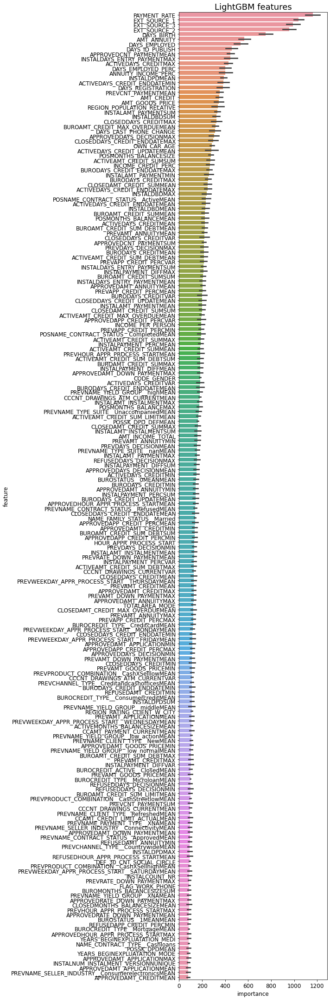

In [413]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run LightGBM with kfold"):
    feat_importance_lgbm, train_df_lgbm, test_df_lgbm = kfold_lightgbm(df_prep, n_folds=10, stratified=True, debug=debug)
%store feat_importance_lgbm
%store train_df_lgbm
%store test_df_lgbm

Starting LightGBM. Train shape: (10000, 796), test shape: (10000, 796)


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.892267	training's binary_logloss: 0.198368	valid_1's auc: 0.777337	valid_1's binary_logloss: 0.242254
[400]	training's auc: 0.937851	training's binary_logloss: 0.169543	valid_1's auc: 0.77667	valid_1's binary_logloss: 0.242549
Fold  1 AUC : 0.779423


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.887964	training's binary_logloss: 0.201017	valid_1's auc: 0.793648	valid_1's binary_logloss: 0.230319
[400]	training's auc: 0.935132	training's binary_logloss: 0.172609	valid_1's auc: 0.797263	valid_1's binary_logloss: 0.227362
Fold  2 AUC : 0.799141


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.890751	training's binary_logloss: 0.199301	valid_1's auc: 0.772026	valid_1's binary_logloss: 0.236376
[400]	training's auc: 0.935649	training's binary_logloss: 0.170422	valid_1's auc: 0.778144	valid_1's binary_logloss: 0.235237
[600]	training's auc: 0.961924	training's binary_logloss: 0.149958	valid_1's auc: 0.774682	valid_1's binary_logloss: 0.236425
Fold  3 AUC : 0.778353


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.893982	training's binary_logloss: 0.197868	valid_1's auc: 0.761166	valid_1's binary_logloss: 0.239383
Fold  4 AUC : 0.764155


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.890464	training's binary_logloss: 0.199765	valid_1's auc: 0.764336	valid_1's binary_logloss: 0.236624
Fold  5 AUC : 0.765018


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.89301	training's binary_logloss: 0.199165	valid_1's auc: 0.76871	valid_1's binary_logloss: 0.235214
[400]	training's auc: 0.938498	training's binary_logloss: 0.170386	valid_1's auc: 0.777603	valid_1's binary_logloss: 0.232444
[600]	training's auc: 0.963505	training's binary_logloss: 0.149534	valid_1's auc: 0.778137	valid_1's binary_logloss: 0.231964
Fold  6 AUC : 0.780093


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.895332	training's binary_logloss: 0.198188	valid_1's auc: 0.76273	valid_1's binary_logloss: 0.237989
Fold  7 AUC : 0.763870


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.891889	training's binary_logloss: 0.199124	valid_1's auc: 0.787635	valid_1's binary_logloss: 0.229887
Fold  8 AUC : 0.788268


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.891106	training's binary_logloss: 0.199018	valid_1's auc: 0.747492	valid_1's binary_logloss: 0.242991
[400]	training's auc: 0.936196	training's binary_logloss: 0.170486	valid_1's auc: 0.753331	valid_1's binary_logloss: 0.242553
Fold  9 AUC : 0.753162


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.889817	training's binary_logloss: 0.199826	valid_1's auc: 0.767373	valid_1's binary_logloss: 0.235649
[400]	training's auc: 0.93741	training's binary_logloss: 0.170013	valid_1's auc: 0.768851	valid_1's binary_logloss: 0.233832
Fold 10 AUC : 0.772425
Full train AUC score 0.773760
Full test  AUC score 0.774391
Alors, c'est pareil, hein ?
Run LightGBM with kfold - done in 97s
Stored 'feat_importance_lgbm_10000' (DataFrame)
Stored 'train_df_lgbm_10000' (DataFrame)
Stored 'test_df_lgbm_10000' (DataFrame)


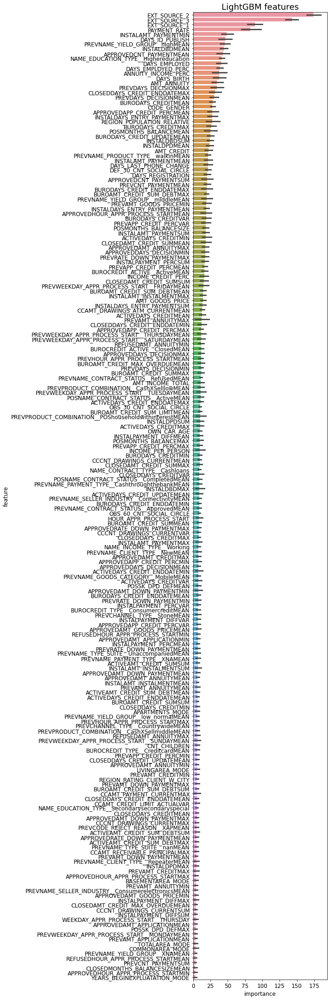

In [415]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run LightGBM with kfold"):
    feat_importance_lgbm_10000, train_df_lgbm_10000, test_df_lgbm_10000 = kfold_lightgbm(df_prep_10000, n_folds=10, stratified=True, debug=debug)
%store feat_importance_lgbm_10000
%store train_df_lgbm_10000
%store test_df_lgbm_10000

Starting LightGBM. Train shape: (3000, 795), test shape: (3000, 795)
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[200]	training's auc: 0.855926	training's binary_logloss: 0.218064	valid_1's auc: 0.791365	valid_1's binary_logloss: 0.241841
[400]	training's auc: 0.895058	training's binary_logloss: 0.197198	valid_1's auc: 0.802385	valid_1's binary_logloss: 0.23622
Fold  1 AUC : 0.802385


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.859796	training's binary_logloss: 0.217978	valid_1's auc: 0.784722	valid_1's binary_logloss: 0.239939
[400]	training's auc: 0.895177	training's binary_logloss: 0.19788	valid_1's auc: 0.80314	valid_1's binary_logloss: 0.234571
Fold  2 AUC : 0.803744


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.86038	training's binary_logloss: 0.216963	valid_1's auc: 0.75619	valid_1's binary_logloss: 0.251905
Fold  3 AUC : 0.764870


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.858049	training's binary_logloss: 0.218762	valid_1's auc: 0.793176	valid_1's binary_logloss: 0.237736
[400]	training's auc: 0.892674	training's binary_logloss: 0.19832	valid_1's auc: 0.812953	valid_1's binary_logloss: 0.230908
[600]	training's auc: 0.916056	training's binary_logloss: 0.183622	valid_1's auc: 0.808877	valid_1's binary_logloss: 0.231635
Fold  4 AUC : 0.814614


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.860244	training's binary_logloss: 0.218652	valid_1's auc: 0.807065	valid_1's binary_logloss: 0.236079
Fold  5 AUC : 0.817029


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.856857	training's binary_logloss: 0.217742	valid_1's auc: 0.791365	valid_1's binary_logloss: 0.241161
[400]	training's auc: 0.897588	training's binary_logloss: 0.196501	valid_1's auc: 0.799517	valid_1's binary_logloss: 0.236975
Fold  6 AUC : 0.800423


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.859453	training's binary_logloss: 0.216957	valid_1's auc: 0.744414	valid_1's binary_logloss: 0.252471
Fold  7 AUC : 0.750000


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.863585	training's binary_logloss: 0.215694	valid_1's auc: 0.659237	valid_1's binary_logloss: 0.258511
[400]	training's auc: 0.8981	training's binary_logloss: 0.196398	valid_1's auc: 0.667242	valid_1's binary_logloss: 0.261248
Fold  8 AUC : 0.662847


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.858949	training's binary_logloss: 0.217956	valid_1's auc: 0.732695	valid_1's binary_logloss: 0.245524
[400]	training's auc: 0.89476	training's binary_logloss: 0.19624	valid_1's auc: 0.747292	valid_1's binary_logloss: 0.242029
[600]	training's auc: 0.917846	training's binary_logloss: 0.181224	valid_1's auc: 0.743996	valid_1's binary_logloss: 0.241989
Fold  9 AUC : 0.748234


'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.864776	training's binary_logloss: 0.216517	valid_1's auc: 0.730968	valid_1's binary_logloss: 0.244081
Fold 10 AUC : 0.735363
Full train AUC score 0.763960
Full test  AUC score 0.769951
Alors, c'est pareil, hein ?
Run LightGBM with kfold - done in 30s
Stored 'feat_importance_lgbm_3000' (DataFrame)
Stored 'train_df_lgbm_3000' (DataFrame)
Stored 'test_df_lgbm_3000' (DataFrame)


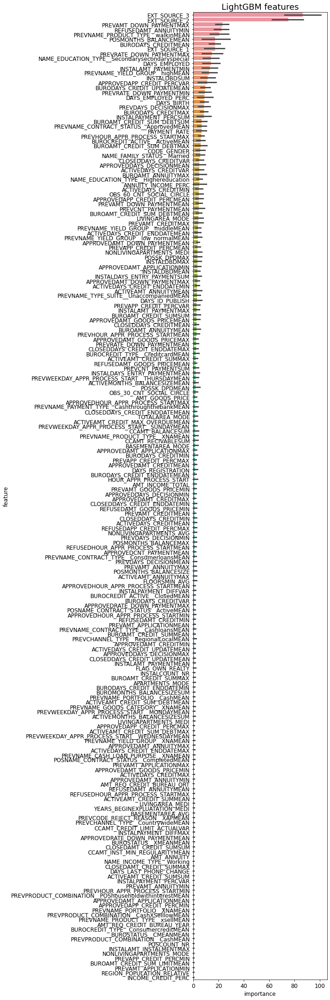

In [414]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run LightGBM with kfold"):
    feat_importance_lgbm_3000, train_df_lgbm_3000, test_df_lgbm_3000 = kfold_lightgbm(df_prep_3000, n_folds=10, stratified=True, debug=debug)
%store feat_importance_lgbm_3000
%store train_df_lgbm_3000
%store test_df_lgbm_3000

## Variables de niveau 2 et 3

In [ ]:
selected_features_file = data_dir+'selected_features.csv'
selected_features = read_feature_selection(selected_features_file, min_level=2)
selected_features.head()

In [ ]:
debug = False
df_prep, cat_cols, num_cols = preprocess(selected_features=selected_features, debug=debug)

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run RandomForest"):
    feat_importance_rf, train_df_rf, test_df_rf = kfold_algo(df, cat_cols, num_cols, algo_name='RandomForest', n_folds=5, stratified=True, debug=debug)
# %store feat_importance_rf
# %store train_df_rf
# %store test_df_rf

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run XGBoost"):
    feat_importance_xgb, train_df_xgb, test_df_xgb = kfold_algo(df, cat_cols, num_cols, algo_name='XGBoost', n_folds=5, stratified=True, debug=debug)
# %store feat_importance_xgb
# %store train_df_xgb
# %store test_df_xgb

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run LightGBM with kfold"):
    feat_importance_lgbm, train_df_lgbm, test_df_lgbm = kfold_lightgbm(df, n_folds=10, stratified=True, debug=debug)
# %store feat_importance_lgbm
# %store train_df_lgbm
# %store test_df_lgbm

## Variables de niveau 3

In [ ]:
selected_features_file = data_dir+'selected_features.csv'
selected_features = read_feature_selection(selected_features_file, min_level=3)
selected_features.head()

In [ ]:
debug = True
df_prep, cat_cols, num_cols = preprocess(selected_features=selected_features, debug=debug, num_rows=10000)

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run RandomForest"):
    feat_importance_rf, train_df_rf, test_df_rf = kfold_algo(df, cat_cols, num_cols, algo_name='RandomForest', n_folds=5, stratified=True, debug=debug)
# %store feat_importance_rf
# %store train_df_rf
# %store test_df_rf

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run XGBoost"):
    feat_importance_xgb, train_df_xgb, test_df_xgb = kfold_algo(df, cat_cols, num_cols, algo_name='XGBoost', n_folds=5, stratified=True, debug=debug)
# %store feat_importance_xgb
# %store train_df_xgb
# %store test_df_xgb

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
with timer("Run LightGBM with kfold"):
    feat_importance_lgbm, train_df_lgbm, test_df_lgbm = kfold_lightgbm(df, n_folds=10, stratified=True, debug=debug)
# %store feat_importance_lgbm
# %store train_df_lgbm
# %store test_df_lgbm

In [ ]:
plt.rcParams['figure.figsize'] = [10, 40]
display_importances(feat_importance_lgbm, 200)

In [ ]:
feat_importance = feat_importance_lgbm.copy()

In [ ]:
# for col, val in feat_importance[['feature', 'importance']].values:
fi = feat_importance[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)
for col, val in zip(fi.index, fi.values):
    if 'NAME_CONTRACT_STATUS' in col: #ACTIVE_, CLOSED_, BURO_
        print(col, val)

# DOE

## Score personnalisé

In [79]:
def custom_metric_threshold(y_true, y_pred_1, **kwargs): #threshold=0.5
    """Fonction custom de scoring, calculant un bilan financier en fonction d'un seuil de décision
    et des données d'entraînement.
    
    Parameters
    ----------
    y_true : 1D
        Contient les labels réels
    y_pred_1 : 1D
        Contient les probas de la classe 1
    X_train : pandas.DataFrame
        Dataset servant au calcul du bilan financier.
    threshold : float
        Seuil utilisé pour déclarer la prédiction à la valeur 0.
    """
    # False Positive : on perd le bénéfice du prêt, càd AMT_ANNUITY
    # False Negative : on perd le reste à rembourser, çàd AMT_CREDIT dans le pire des cas
    # True Positive : on gagne le bénéfice du prêt
    # True Negative : on ne perd ni ne gagne rien
    X_train = kwargs['X_train']
    threshold = kwargs['threshold']
    if 'alpha' in kwargs: 
        alpha = kwargs['alpha']
    else:
        alpha = None
    
    X_work = X_train.loc[y_true.index].copy()
    y_pred_0 = 1. - y_pred_1
    is_acceptable = (y_pred_1 <= threshold) # is_acceptable <=> "prédit N"
    
    selected_TN = (is_acceptable)  & (y_true==0)
    selected_FP = (~is_acceptable) & (y_true==0)
    selected_FN = (is_acceptable)  & (y_true==1)
    selected_TP = (~is_acceptable) & (y_true==1)

    gain = 0.
    if alpha is None:
        gain_TN = (X_work.loc[selected_TN, 'AMT_ANNUITY'] * X_work.loc[selected_TN, 'CNT_PAYMENT_NR'] - \
                  X_work.loc[selected_TN, 'AMT_CREDIT']) #* y_pred_0[selected_TN]
        gain_FP = 0. * X_work.loc[selected_FP, 'AMT_ANNUITY']
        gain_FN = (X_work.loc[selected_FN, 'AMT_CREDIT']) #* y_pred_1[selected_FN]
        gain_TP = 0. * X_work.loc[selected_TP, 'AMT_CREDIT' ]
        gain = gain_TN.sum() - gain_FP.sum() - gain_FN.sum() + gain_TP.sum()
    else:
        gain = 33309. * (selected_TN.sum() - alpha*selected_FN.sum())
    # Gain moyen
    gain = gain / y_true.shape[0]
    return gain

# custom_score_threshold = make_scorer(custom_metric_threshold, greater_is_better=True, needs_proba=True, X_train=train_df, threshold=0.5, alpha=3.)

## Préparation

### Paramètres généraux

In [80]:
problem_kind = 'classification'
target_col = 'TARGET'

### Données

In [81]:
selected_features_file = data_dir+'selected_features.csv'
selected_features = read_feature_selection(selected_features_file, min_level=3)
selected_features.head()

,Column1,Table,Row,Traduction description,Non-relaxable,Interet,Commentaire interet,Operations,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID de pret dans notre echantillon,0,3,NaN,NaN,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Variable cible (1 - Client avec difficultes de...,0,3,NaN,NaN,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification si le pret est cash ou revolving,1,3,Revolving = plutet surendettatoire,[mean],Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Sexe du client,1,3,LGBM2,NaN,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag Si le client possede une voiture,1,3,NaN,NaN,Flag if the client owns a car,NaN


In [82]:
debug = False
df_prep, cat_cols, num_cols = preprocess(selected_features=selected_features, debug=False) # selected_features=selected_features
train_df = df_prep[df_prep['TARGET'].notnull()]
test_df  = df_prep[df_prep['TARGET'].isnull()]

Train samples: 307511, test samples: 48744
Bureau df shape: (305811, 60)
Process bureau and bureau_balance - done in 18s
Previous applications df shape: (338858, 45)
Process previous_applications - done in 8s
Pos-cash balance df shape: (337252, 4)
Process POS-CASH balance - done in 5s
Installments payments df shape: (339587, 7)
Process installments payments - done in 4s
Credit card balance df shape: (103558, 20)
Process credit card balance - done in 5s
create_cnt_payment: train score = 0.940
create_cnt_payment: test score  = 0.823
Create new variables - done in 11s


In [83]:
debug = True
df_prep_3000, cat_cols_3000, num_cols_3000 = preprocess(selected_features=selected_features, debug=debug)
train_df_3000 = df_prep_3000[df_prep_3000['TARGET'].notnull()]
test_df_3000  = df_prep_3000[df_prep_3000['TARGET'].isnull()]

Train samples: 3000, test samples: 3000
Bureau df shape: (305811, 60)
Process bureau and bureau_balance - done in 17s
Previous applications df shape: (338858, 45)
Process previous_applications - done in 8s
Pos-cash balance df shape: (337252, 4)
Process POS-CASH balance - done in 4s
Installments payments df shape: (339587, 7)
Process installments payments - done in 3s
Credit card balance df shape: (103558, 20)
Process credit card balance - done in 4s
create_cnt_payment: train score = 0.936
create_cnt_payment: test score  = 0.827
Create new variables - done in 11s


In [84]:
debug = False
df_prep_10000, cat_cols_10000, num_cols_10000 = preprocess(selected_features=selected_features, num_rows=10000)
train_df_10000 = df_prep_10000[df_prep_10000['TARGET'].notnull()]
test_df_10000  = df_prep_10000[df_prep_10000['TARGET'].isnull()]

Train samples: 10000, test samples: 10000
Bureau df shape: (305811, 60)
Process bureau and bureau_balance - done in 16s
Previous applications df shape: (338858, 45)
Process previous_applications - done in 8s
Pos-cash balance df shape: (337252, 4)
Process POS-CASH balance - done in 5s
Installments payments df shape: (339587, 7)
Process installments payments - done in 3s
Credit card balance df shape: (103558, 20)
Process credit card balance - done in 4s
create_cnt_payment: train score = 0.936
create_cnt_payment: test score  = 0.817
Create new variables - done in 9s


In [85]:
debug = False
df_prep_20000, cat_cols_20000, num_cols_20000 = preprocess(selected_features=selected_features, num_rows=20000)
train_df_20000 = df_prep_20000[df_prep_20000['TARGET'].notnull()]
test_df_20000  = df_prep_20000[df_prep_20000['TARGET'].isnull()]

Train samples: 20000, test samples: 20000
Bureau df shape: (305811, 60)
Process bureau and bureau_balance - done in 16s
Previous applications df shape: (338858, 45)
Process previous_applications - done in 8s
Pos-cash balance df shape: (337252, 4)
Process POS-CASH balance - done in 4s
Installments payments df shape: (339587, 7)
Process installments payments - done in 3s
Credit card balance df shape: (103558, 20)
Process credit card balance - done in 4s
create_cnt_payment: train score = 0.941
create_cnt_payment: test score  = 0.832
Create new variables - done in 10s


In [86]:
debug = False
df_prep_62000, cat_cols_62000, num_cols_62000 = preprocess(selected_features=selected_features, num_rows=62000)
train_df_62000 = df_prep_62000[df_prep_62000['TARGET'].notnull()]
test_df_62000  = df_prep_62000[df_prep_62000['TARGET'].isnull()]

Train samples: 62000, test samples: 48744
Bureau df shape: (305811, 60)
Process bureau and bureau_balance - done in 17s
Previous applications df shape: (338858, 45)
Process previous_applications - done in 9s
Pos-cash balance df shape: (337252, 4)
Process POS-CASH balance - done in 4s
Installments payments df shape: (339587, 7)
Process installments payments - done in 4s
Credit card balance df shape: (103558, 20)
Process credit card balance - done in 6s
create_cnt_payment: train score = 0.942
create_cnt_payment: test score  = 0.826
Create new variables - done in 12s


In [87]:
# Data augm : x -> x*0.08* 0.92/0.08 + x*0.92 = 1.84*x. Si on en veut 3000 à la fin il faut x = 3000/1.84 = 1600

In [88]:
debug = False
df_prep_1600, cat_cols_1600, num_cols_1600 = preprocess(selected_features=selected_features, num_rows=1600)
train_df_1600 = df_prep_1600[df_prep_1600['TARGET'].notnull()]
test_df_1600  = df_prep_1600[df_prep_1600['TARGET'].isnull()]

Train samples: 1600, test samples: 1600
Bureau df shape: (305811, 60)
Process bureau and bureau_balance - done in 17s
Previous applications df shape: (338858, 45)
Process previous_applications - done in 8s
Pos-cash balance df shape: (337252, 4)
Process POS-CASH balance - done in 5s
Installments payments df shape: (339587, 7)
Process installments payments - done in 3s
Credit card balance df shape: (103558, 20)
Process credit card balance - done in 4s
create_cnt_payment: train score = 0.939
create_cnt_payment: test score  = 0.822
Create new variables - done in 15s


In [89]:
debug = False
df_prep_5000, cat_cols_5000, num_cols_5000 = preprocess(selected_features=selected_features, num_rows=5000)
train_df_5000 = df_prep_5000[df_prep_5000['TARGET'].notnull()]
test_df_5000  = df_prep_5000[df_prep_5000['TARGET'].isnull()]

Train samples: 5000, test samples: 5000
Bureau df shape: (305811, 60)
Process bureau and bureau_balance - done in 25s
Previous applications df shape: (338858, 45)
Process previous_applications - done in 11s
Pos-cash balance df shape: (337252, 4)
Process POS-CASH balance - done in 6s
Installments payments df shape: (339587, 7)
Process installments payments - done in 5s
Credit card balance df shape: (103558, 20)
Process credit card balance - done in 6s
create_cnt_payment: train score = 0.943
create_cnt_payment: test score  = 0.832
Create new variables - done in 18s


### Hyperparamètres

Poids relatifs de la classe positive / négative :

In [90]:
y = train_df['TARGET']
counter = Counter(y)
weight = counter[0] / counter[1]
weight

11.386988922457201

In [91]:
# Dictionnaires d'hyperparamètres
param_grid_dum = {}
param_grid_dumgen = {}

# param_grid_knn  = {'n_neighbors': range(1, 10)}

weights = np.linspace(0.05, 0.95, 20)
param_grid_lr = {
    'class_weight': [None, 'balanced'], #, {0: x, 1: 1.0-x} for x in weights
    'C': [0.0001, 0.001, 0.01],
    'dual': [False],
    'fit_intercept': [True],
    'intercept_scaling': [1],
    'max_iter': [1000],
    'multi_class': ['ovr'],
    'penalty': ['l2'],
    'random_state': [None],
    'solver': ['liblinear'], 'n_jobs': [1], # n_jobs=1 pour liblinear
    'tol': [0.0001],
    'warm_start': [False],
    'random_state': [18011975],
}

param_grid_gnb = {}

param_grid_xgbc = {
    'nthread': [10],
    'random_state': [18011975],
    'scale_pos_weight': [1], # weight moins bien que 1 sur le ROC_AUC
    'n_estimators': [500],  #[1000], #[20, 50, 100, 200], #[500, 1000, 10000] # 500 mieux que 100, 200, 1000
    'learning_rate': [0.05],  # [0.01, 0.05, 0.1, 0.3], 0.05 mieux que 0.01, 0.1
    'max_depth': [5], # 5 mieux que 10
    'colsample_bytree': [0.8],  # [0.5, 1.], 0.8 mieux que 0.2, 0.5, 1.
    'colsample_bylevel': [0.5], # 0.5 mieux que 0.7, 1
    'subsample': [1.], # 1. mieux que 0.5, 0.7, 
    'max_delta_step': [10], #mieux que 0, 2
    'max_leaves': [0], # 0 mieux que 5
#     'min_child_weight': [1., 5., 7.], # ne rien mettre mieux que [1., 5., 7.]
#     'gamma': [1., 5., 10.], # ne rien mettre ou 0. mieux que [1., 5., 10.]
#     'alpha': [0., 1., 100., 200.], # ne rien mettre ou 0. mieux que [0., 1., 100., 200.]
#     'colsample_by_node': [1], # Renvoie un warning
#     'lambda': [1], # à tester
#     'max_bin': 256,
#     'enable_categorical': False, # CatBoost ??!!
#     'monotone_constraints': '()', A TESTER ABSOLUMENT
}
param_grid_xgbc_weight = {
    'nthread': [10],
    'random_state': [18011975],
    'scale_pos_weight': [weight], # [weight, 50, 100, 1000]
    'n_estimators': [500],  #[1000], #[20, 50, 100, 200], #[500, 1000, 10000] # 500 mieux que 100, 200, 1000
    'learning_rate': [0.05],  # [0.01, 0.05, 0.1, 0.3], 0.05 mieux que 0.01, 0.1
    'max_depth': [5], # 5 mieux que 10
    'colsample_bytree': [0.8],  # [0.5, 1.], 0.8 mieux que 0.2, 0.5, 1.
    'colsample_bylevel': [0.5], # 0.5 mieux que 0.7, 1
    'subsample': [1.], # 1. mieux que 0.5, 0.7, 
    'max_delta_step': [10], #mieux que 0, 2
    'max_leaves': [0], # 0 mieux que 5
}
   
param_grid_lgbc = {
    'nthread': [4],
    'n_estimators': [10000],
    'learning_rate': [0.02],
    'num_leaves': [34],
    'colsample_bytree': [0.9497036],
    'subsample': [0.8715623],
    'max_depth': [8],
    'reg_alpha': [0.041545473],
    'reg_lambda': [0.0735294],
    'min_split_gain': [0.0222415],
    'min_child_weight': [39.3259775],
    'verbose': [-1],
    'random_state': [18011975],
#     'silent': [-1],
}

param_grid_rfc = {
    'class_weight': [None, 'balanced', 'balanced_subsample'],
    'n_estimators': [200, 500], #[20, 50, 100, 200]
    'max_depth': [None, 2], #[None, 1, 2, 5],
    'min_samples_split': [2, 5], #[2, 5, 10],
    'random_state': [18011975],
}

### Algorithmes

In [92]:
algos_clf = [
#     {'surname': 'Dummy stratified',
#      'class': DummyClassifier(strategy='stratified'),
#      'param_grid': param_grid_dum},

    {'surname': 'Dummy generous',
     'class': DummyClassifier(strategy='constant', constant=0), # On prédit tous les clients à Négatif
     'param_grid': param_grid_dumgen},

    {'surname': 'Gaussian Naive Bayes',
     'class': GaussianNB(),
     'param_grid': param_grid_gnb},
    {'surname': 'Logistic',
     'class': LogisticRegression(verbose=0), # class_weight='balanced'
     'param_grid': param_grid_lr},
    
    {'surname': 'XGBoost',
    'class': XGBClassifier(), # 
    'param_grid': param_grid_xgbc},
    {'surname': 'XGBoost_weight',
    'class': XGBClassifier(), # 
    'param_grid': param_grid_xgbc_weight},
    {'surname': 'RandomForest',
     'class': RandomForestClassifier(), # class_weight={0:1, 1:10}
     'param_grid': param_grid_rfc},

    {'surname': 'LightGBM',
     'class': LGBMClassifier(), # class_weight={0:1, 1:10}
     'param_grid': param_grid_lgbc},
]

### Scalers

In [93]:
scalers = [MinMaxScaler, StandardScaler] #, StandardScaler # MinMaxScaler légèrement meilleur sur ce problème
# encoders = [OneHotEncoder(sparse=False,handle_unknown='ignore')]
encoders = [None] # L'encadage est fait dans le préprocessing des données

### Scores et seuils

In [94]:
# Autres scores demandés dans les métriques sorties
scores = ['roc_auc'] # ['roc_auc', 'precision', 'recall', 'f1']

Le `threshold` si-dessous est le seuil de **risque à prêter**, càd le risque maximal que l'on s'autorise sur la valeur de la probabilité de la **classe 1 (positif)**. Il est mis en regard de ce que reçoit la fonction de scoring en classification binaire : la proba de la classe 1. Il varie donc **entre 0. et 1.**.

In [95]:
SCORING_STUDY = 'custom_fixed' # 'roc_auc', 'custom_fixed', 'custom_lil_grid', 'custom_fine_grid', 'compare', 'compare2',
# 'compare_fast'

if SCORING_STUDY=='roc_auc':
    scoring_data = [
        {'score_function': 'roc_auc',
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': train_df,
                          'threshold': 0.50,
                          'alpha': None}},
    ]
elif SCORING_STUDY=='custom_fixed':
    scoring_data = [
        {'score_function': custom_metric_threshold,
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': train_df,
                          'threshold': 0.20,
                          'alpha': None}},
    ]
elif SCORING_STUDY=='custom_lil_grid':
    scoring_data = [
        {'score_function': custom_metric_threshold,
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': train_df,
                          'threshold': 0.00,
                          'alpha': None}},
        {'score_function': custom_metric_threshold,
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': train_df,
                          'threshold': 0.05,
                          'alpha': None}},
        {'score_function': custom_metric_threshold,
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': train_df,
                          'threshold': 0.20,
                          'alpha': None}},
        {'score_function': custom_metric_threshold,
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': train_df,
                          'threshold': 0.49,
                          'alpha': None}},
    ]
elif SCORING_STUDY=='custom_fine_grid':
    scoring_data = [
        {'score_function': custom_metric_threshold,
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': train_df,
                          'threshold': s/100.,
                          'alpha': None}} for s in range(0, 110, 10) # range(0, 105, 5)
    ]
elif SCORING_STUDY=='compare':
    scoring_data = [
        {'score_function': 'roc_auc',
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': None,
                          'threshold': 0.5,
                          'alpha': None}}
    ] + [
        {'score_function': custom_metric_threshold,
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': train_df,
                          'threshold': s/100.,
                          'alpha': a}} for s in range(0, 110, 10) for a in [None, 2., 3., 5., 10.]
    ]
elif SCORING_STUDY=='compare2':
    scoring_data = [
        {'score_function': 'roc_auc',
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': None,
                          'threshold': 0.5,
                          'alpha': None}}
    ] + [
        {'score_function': custom_metric_threshold,
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': train_df,
                          'threshold': s/100.,
                          'alpha': a}} for s in [10., 20., 50.] for a in [None, 1., 2., 3., 5., 10.]
    ]
elif SCORING_STUDY=='compare_fast':
    scoring_data = [
        {'score_function': custom_metric_threshold,
         'greater_is_better': True,
         'needs_proba': True,
         'score_params': {'X_train': train_df,
                          'threshold': 0.5,
                          'alpha': 3.}}
    ]    

In [96]:
len(scoring_data)

1

### Variables sélectionnées

In [97]:
def build_model_cols(df):
    models_cols = [
        {'categ_cols':[], # Tout est déjà encodé
         'num_cols'  :[f for f in df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']],
        },
    ]
    return models_cols

In [98]:
def build_doe(algos_clf, encoders, scalers, models_cols, scoring_data=None):
    if SCORING_STUDY=='roc_auc':
        doe = list(itertools.product(algos_clf, encoders, scalers, models_cols))
        columns = ['Algorithm', 'Encoder', 'Scaler', 'Variables']
    else:
        doe = list(itertools.product(algos_clf, encoders, scalers, models_cols, scoring_data))
        columns = ['Algorithm', 'Encoder', 'Scaler', 'Variables', 'Scoring data']
    df_doe = pd.DataFrame(data=doe, columns=columns)
    return df_doe

In [99]:
models_cols = build_model_cols(train_df)
# Imbalanced / over+under
models_cols_3000 = build_model_cols(train_df_3000)
models_cols_10000 = build_model_cols(train_df_10000)
# Under
models_cols_20000 = build_model_cols(train_df_20000)
models_cols_62000 = build_model_cols(train_df_62000)
# Over
models_cols_1600 = build_model_cols(train_df_1600)
models_cols_5000 = build_model_cols(train_df_5000)

In [100]:
TEST_LEVEL = 'TUNING' # 'DEBUG' / 'TUNING' / 'FULL'

In [101]:
if TEST_LEVEL=='DEBUG':
    # Imbalanced / over+under
    df_doe_init_imbal = build_doe(algos_clf, encoders, scalers, models_cols_3000, scoring_data)
    train_df_imbal = train_df_3000
    df_doe_init_over_under = build_doe(algos_clf, encoders, scalers, models_cols_3000, scoring_data)
    train_df_over_under = train_df_3000
    # Under
    df_doe_init_under = build_doe(algos_clf, encoders, scalers, models_cols_20000, scoring_data)
    train_df_under = train_df_20000
    # Over
    df_doe_init_over = build_doe(algos_clf, encoders, scalers, models_cols_1600, scoring_data)
    train_df_over = train_df_1600
elif TEST_LEVEL=='TUNING':
    # Imbalanced / over+under
    df_doe_init_imbal = build_doe(algos_clf, encoders, scalers, models_cols_10000, scoring_data)
    train_df_imbal = train_df_10000
    df_doe_init_over_under = build_doe(algos_clf, encoders, scalers, models_cols_10000, scoring_data)
    train_df_over_under = train_df_10000
    # Under
    df_doe_init_under = build_doe(algos_clf, encoders, scalers, models_cols_62000, scoring_data)
    train_df_under = train_df_62000
    # Over
    df_doe_init_over = build_doe(algos_clf, encoders, scalers, models_cols_5000, scoring_data)
    train_df_over = train_df_5000
elif TEST_LEVEL=='FULL':
    # Imbalanced / over+under
    df_doe_init_imbal = build_doe(algos_clf, encoders, scalers, models_cols, scoring_data)
    train_df_imbal = train_df
    df_doe_init_over_under = build_doe(algos_clf, encoders, scalers, models_cols, scoring_data)
    train_df_over_under = train_df
    # Under
    df_doe_init_under = build_doe(algos_clf, encoders, scalers, models_cols, scoring_data)
    train_df_under = train_df
    # Over
    df_doe_init_over = build_doe(algos_clf, encoders, scalers, models_cols, scoring_data)
    train_df_over = train_df

## Lancement

### Work

In [414]:
##################
# Work
##################
print(train_df_imbal.shape)
df_doe_work, algos_results_work, s, best_mdl_work, best_mdl_name = \
        MLstuff.classification_doe(train_df_imbal, df_doe_init_imbal,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=False, # 'SMOTE', 'RandomUnderSampler'
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_work

(10000, 274)
Taille du dataset de classification  : (10000, 274)
Taille du dataset d'entrainement : (8000, 272)

Algorithme LightGBM :
---------------------

None
y_train.value_counts() = 0.0    7380
1.0     620
Name: TARGET, dtype: int64
--- SANS over/undersampling
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
y_train_pred = [0.02146063 0.03514644 0.03726204 ... 0.06557971 0.00101169 0.00051807]
y_test_pred =       TARGET_pred
3562     0.001224
5768     0.003754
8884     0.082031
3883     0.317622
8428     0.002788
...           ...
9693     0.002412
5722     0.002107
3475     0.151631
9733     0.002647
2539     0.000345

[2000 rows x 1 columns]
score = roc_auc
score_str = roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__colsample_bytree': 0.9497036, 'model__learning_rate': 0.02, 'model__max_depth': 8, 'model__min_child_weight': 39.3259775, 'model__min_split_gain': 0.0222415, 'model__n_estimators'

,Algorithm,Encoder,Scaler,Variables,Scoring data,Best params,Scoring,Train custom_score,Test custom_score,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time
0,"{'surname': 'LightGBM', 'class': LGBMClassifie...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bytree': 0.9497036, 'model_...",roc_auc,312242.173875,270390.3165,1.0,N/A,0.698872,N/A,139.132990
1,"{'surname': 'LightGBM', 'class': LGBMClassifie...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bytree': 0.9497036, 'model_...",roc_auc,312239.408625,268551.4635,1.0,N/A,0.700243,N/A,131.495764


In [173]:
##################
# Work
##################
print(train_df_imbal.shape)
df_doe_work, algos_results_work, s, best_mdl_work, best_mdl_name = \
        MLstuff.classification_doe(train_df_under, df_doe_init_under,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling='RandomUnderSampler',
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_work

(10000, 274)
Taille du dataset de classification  : (61998, 276)
score_data = {'score_function': 'roc_auc', 'greater_is_better': True, 'needs_proba': True, 'score_params': {'X_train': None, 'threshold': 0.5, 'alpha': None}}
score_params = {'X_train': None, 'threshold': 0.5, 'alpha': None}
Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
score = roc_auc
score_str = roc_auc
Meilleurs hyperparamètr

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = None
gain = 13294482673.5
t

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 1.0
gain = 1386253962.0
thr

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 2.0
gain = 1253351052.0
thr

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 3.0
gain = 1120448142.0
thr

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 5.0
gain = 854642322.0
thre

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 10.0
gain = 190127772.0
thr

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = None
gain = 13294482673.5
threshold = 0.2
y_pred_1 = 31710    0.0
40416    0.0
20029    0.0
45501    0.0
33999    0.0
        ... 
22486    0.0
7466     0.0
12129    0.0
4251     0.0
14164    0.0
Name: TARGET_pred, Length: 12400, dtype: f

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 1.0
gain = 1386253962.0
thr

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 2.0
gain = 1253351052.0
thr

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 3.0
gain = 1120448142.0
thr

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 5.0
gain = 854642322.0
thre

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 


Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 10.0
gain = 190127772.0
threshold = 0.2
y_pred_1 = 31710    0.0
40416    0.

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = None
gain = 13294482673.5
t

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 1.0
gain = 1386253962.0
thr

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 2.0
gain = 1253351052.0
threshold = 0.5
y_pred_1 = 31710    0.0
40416    0.0
20029    0.0
45501    0.0
33999    0.0
        ... 
2248

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 3.0
gain = 1120448142.0
threshold = 0.5
y_pred_1 = 31710    0.0
40416    0.0
20029    0.0
45501    0.0
33999    0.0
        ... 
22486    0.0
7466     0.0
12129    0.0
4251     0.0
14164    0.0
Name: TARGET_pred, Length: 12400, dtype: flo

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 


Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 5.0
gain = 854642322.0
threshold = 0.5
y_pred_1 = 31710    0.0
40416    0.0

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 


Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.0
43159    0.0
9005     0.0
31728    0.0
54367    0.0
        ... 
55138    0.0
42950    0.0
4598     0.0
21778    0.0
49406    0.0
Name: TARGET_pred, Length: 49598, dtype: float64
selected_TN.sum() = 45608
selected_FP.sum() = 0
selected_FN.sum() = 3990
selected_TP.sum() = 0
alpha = 10.0
gain = 190127772.0
threshold = 0.5
y_pred_1 = 31710    0.0
40416    0.

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 2962
selected_FP.sum(

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 2962
selected_FP.sum() = 42646
selected_FN.sum() = 1
selected_TP.sum() = 3989
alpha = 1.0
gain = 98627949.0
thres

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 2962
selected_FP.sum(

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 2962
selected_FP.sum(

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 2962
selected_FP.sum() = 42646
selected_FN.sum() = 1
selected_TP.sum() = 3989
alpha = 5.0
gain = 98494713.0
threshold = 0.1
y_pred_1 = 31710    0.820650
40416    0.431540
20029    0.083620
45501    0.384361
33999    0.

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.1
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 2962
selected_FP.sum(

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 11341
selected_FP.sum

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 11341
selected_FP.sum

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 11341
selected_FP.sum

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 11341
selected_FP.sum

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 11341
selected_FP.sum

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.2
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 11341
selected_FP.sum

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 32647
selected_FP.sum() = 12961
selected_FN.sum() = 335
selected_TP.sum() = 3655
alpha = None
gain = 10739311785.0
thr

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 32647
selected_FP.sum

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 32647
selected_FP.sum

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 32647
selected_FP.sum

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 32647
selected_FP.sum

score_params = {'X_train':         SK_ID_CURR  TARGET  CODE_GENDER_NR  FLAG_OWN_CAR_NR  \
0           100002     1.0               0                0   
1           100003     0.0               1                0   
2           100004     0.0               0                1   
3           100006     0.0               1                0   
4           100007     0.0               0                0   
...            ...     ...             ...              ...   
307506      456251     0.0               0                0   
307507      456252     0.0               1                0   
307508      456253     0.0               1                0   
307509      456254     1.0               1                0   
307510      456255     0.0               1                0   

        FLAG_OWN_REALTY_NR  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                        0          202500.0    406597.5      24700.5   
1                        1          270000.0   1293502.5      35698.5 

Taille du dataset d'entrainement : (49598, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0.22542764 0.6578199  0.9418713  ... 0.52520883 0.1480537  0.27449185]
y_test_pred =        TARGET_pred
31710     0.820650
40416     0.431540
20029     0.083620
45501     0.384361
33999     0.832715
...            ...
22486     0.707368
7466      0.397062
12129     0.137714
4251      0.243241
14164     0.697692

[12400 rows x 1 columns]
threshold = 0.5
y_pred_1 = 47329    0.225428
43159    0.657820
9005     0.941871
31728    0.419799
54367    0.645492
           ...   
55138    0.135072
42950    0.654552
4598     0.525209
21778    0.148054
49406    0.274492
Name: TARGET_pred, Length: 49598, dtype: float32
selected_TN.sum() = 32647
selected_FP.sum

,Algorithm,Encoder,Scaler,Variables,Scoring data,Best params,Scoring,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time,Train custom_score,Test custom_score
0,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...","{'score_function': 'roc_auc', 'greater_is_bett...",{},roc_auc,0.500000,N/A,0.50000,N/A,10.300486,NaN,NaN
1,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,6.912653,1.329448e+10,3.326851e+09
2,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,5.864038,1.386254e+09,3.465468e+08
3,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,5.359807,1.253351e+09,3.133045e+08
4,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,5.124045,1.120448e+09,2.800621e+08
5,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,5.038410,8.546423e+08,2.135773e+08
6,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,4.950771,1.901278e+08,4.736540e+07
7,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,4.298520,1.329448e+10,3.326851e+09
8,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,4.881415,1.386254e+09,3.465468e+08
9,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,4.443509,1.253351e+09,3.133045e+08


In [844]:
##################
# Work
##################
print(train_df_imbal.shape)
df_doe_work, algos_results_work, s, best_mdl_work, best_mdl_name = \
        MLstuff.classification_doe(train_df_over, df_doe_init_over,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling='SMOTE', undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_work

(10000, 274)
Taille du dataset de classification  : (5000, 273)
Taille du dataset d'entrainement : (4000, 271)

Algorithme XGBoost :
--------------------

None
non_relaxable_cols = [0, 1, 2, 9, 10, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 199, 200, 201, 204, 214, 215, 216, 219, 229, 230, 231, 234, 239, 242, 249, 250, 254, 257, 268, 269, 270]
y_train.value_counts() = 0.0    3691
1.0     309
Name:

,Algorithm,Encoder,Scaler,Variables,Best params,Scoring,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time
0,"{'surname': 'XGBoost', 'class': XGBClassifier(...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...","{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,1.0,N/A,0.7255,N/A,51.483747


In [846]:
##################
# Work
##################
print(train_df_imbal.shape)
df_doe_work, algos_results_work, s, best_mdl_work, best_mdl_name = \
        MLstuff.classification_doe(train_df_over_under, df_doe_init_over_under,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling='SMOTE', undersampling='RandomUnderSampler',
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_work

(10000, 274)
Taille du dataset de classification  : (10000, 274)
Taille du dataset d'entrainement : (8000, 272)

Algorithme XGBoost :
--------------------

None
non_relaxable_cols = [0, 1, 2, 9, 10, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 200, 201, 202, 205, 215, 216, 217, 220, 230, 231, 232, 235, 240, 243, 250, 251, 255, 258, 269, 270, 271]
y_train.value_counts() = 0.0    7380
1.0     620

,Algorithm,Encoder,Scaler,Variables,Best params,Scoring,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time
0,"{'surname': 'XGBoost', 'class': XGBClassifier(...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...","{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,0.993841,N/A,0.728501,N/A,46.998086


### Imbalanced

In [102]:
##################
# Imbalanced
##################
print(train_df_imbal.shape)
df_doe_imbal, algos_results_imbal, s, best_mdl_imbal, best_mdl_name = \
        MLstuff.classification_doe(train_df_imbal, df_doe_init_imbal,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_imbal

(10000, 274)
Taille du dataset de classification  : (10000, 274)
Taille du dataset d'entrainement : (8000, 272)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    7380
1.0     620
Name: TARGET, dtype: int64
--- SANS over/undersampling
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =       TARGET_pred
3562          0.0
5768          0.0
8884          0.0
3883          0.0
8428          0.0
...           ...
9693          0.0
5722          0.0
3475          0.0
9733          0.0
2539          0.0

[2000 rows x 1 columns]
score = roc_auc
score_str = roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {}. Score (val) : 2.615e+05
4: 0
{}
Taille du dataset d'entrainement : (8000, 272)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    7380
1.0     620
Name: TARGET, dtype: int64
--- SANS over/undersampling
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =       TARGET_pred
3562          0.

y_train_pred = [0.05982003 0.4008922  0.05618666 ... 0.16989355 0.01558627 0.00275694]
y_test_pred =       TARGET_pred
3562     0.005453
5768     0.086267
8884     0.214675
3883     0.755528
8428     0.133084
...           ...
9693     0.010174
5722     0.083007
3475     0.431847
9733     0.043412
2539     0.005971

[2000 rows x 1 columns]
score = roc_auc
score_str = roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__colsample_bylevel': 0.5, 'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_delta_step': 10, 'model__max_depth': 5, 'model__max_leaves': 0, 'model__n_estimators': 500, 'model__nthread': 10, 'model__random_state': 18011975, 'model__scale_pos_weight': 11.386988922457201, 'model__subsample': 1.0}. Score (val) : 2.216e+05
4: 8
{'model__colsample_bylevel': 0.5, 'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_delta_step': 10, 'model__max_depth': 5, 'model__max_leaves': 0, 'model__n_estimators': 500, 'model__nth

,Algorithm,Encoder,Scaler,Variables,Scoring data,Best params,Scoring,Train custom_score,Test custom_score,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time
0,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,270814.649625,278893.35000,0.500000,N/A,0.500000,N/A,7.117277
1,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,270814.649625,278893.35000,0.500000,N/A,0.500000,N/A,2.645489
2,"{'surname': 'Gaussian Naive Bayes', 'class': G...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,23486.055750,25795.49175,0.528754,N/A,0.507920,N/A,1.468442
3,"{'surname': 'Gaussian Naive Bayes', 'class': G...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,18252.354938,20264.90850,0.525294,N/A,0.508676,N/A,1.553582
4,"{'surname': 'Logistic', 'class': LogisticRegre...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__C': 0.001, 'model__class_weight': Non...",roc_auc,270814.649625,278893.35000,0.643175,N/A,0.617708,N/A,3.590514
5,"{'surname': 'Logistic', 'class': LogisticRegre...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__C': 0.01, 'model__class_weight': None...",roc_auc,262272.012750,263859.90300,0.800064,N/A,0.746953,N/A,5.967231
6,"{'surname': 'XGBoost', 'class': XGBClassifier(...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,311950.496250,271392.77475,0.999836,N/A,0.739348,N/A,57.813518
7,"{'surname': 'XGBoost', 'class': XGBClassifier(...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,311821.679250,272760.62850,0.999887,N/A,0.737932,N/A,64.172493
8,"{'surname': 'XGBoost_weight', 'class': XGBClas...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,261929.544187,221816.37825,0.999896,N/A,0.727658,N/A,63.573067
9,"{'surname': 'XGBoost_weight', 'class': XGBClas...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,262057.072500,222031.20150,0.999929,N/A,0.723819,N/A,64.518603


In [103]:
%store df_doe_imbal
%store algos_results_imbal
%store best_mdl_imbal

Stored 'df_doe_imbal' (DataFrame)
Stored 'algos_results_imbal' (list)
Stored 'best_mdl_imbal' (Pipeline)


### Under

In [104]:
##################
# UNDER
##################
print(train_df_under.shape)
df_doe_under, algos_results_under, s, best_mdl_under, best_mdl_name = \
        MLstuff.classification_doe(train_df_under, df_doe_init_under,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling='RandomUnderSampler',
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_under

(61998, 276)
Taille du dataset de classification  : (61998, 276)
Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3990
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =        TARGET_pred
31710          0.0
40416          0.0
20029          0.0
45501          0.0
33999          0.0
...            ...
22486          0.0
7466           0.0
12129          0.0
4251           0.0
14164          0.0

[12400 rows x 1 columns]
score = roc_auc
score_str = roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {}. Score (val) : 2.626e+05
4: 0
{}
Taille du dataset d'entrainement : (49598, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    45608
1.0     3

y_train_pred = [0.17827049 0.6752912  0.9405817  ... 0.53290313 0.11607618 0.25699884]
y_test_pred =        TARGET_pred
31710     0.889392
40416     0.371488
20029     0.071946
45501     0.325876
33999     0.829047
...            ...
22486     0.714549
7466      0.570595
12129     0.181216
4251      0.202717
14164     0.715215

[12400 rows x 1 columns]
score = roc_auc
score_str = roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__colsample_bylevel': 0.5, 'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_delta_step': 10, 'model__max_depth': 5, 'model__max_leaves': 0, 'model__n_estimators': 500, 'model__nthread': 10, 'model__random_state': 18011975, 'model__scale_pos_weight': 1, 'model__subsample': 1.0}. Score (val) : 6.703e+04
4: 7
{'model__colsample_bylevel': 0.5, 'model__colsample_bytree': 0.8, 'model__learning_rate': 0.05, 'model__max_delta_step': 10, 'model__max_depth': 5, 'model__max_leaves': 0, 'model__n_estimators': 500, 'model__nthread

Dataset resampled.
y_train_temp.value_counts() = 0.0    3990
1.0    3990
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
y_train_pred = [0.20108484 0.48755739 0.97415017 ... 0.88340835 0.09509081 0.12875113]
y_test_pred =        TARGET_pred
31710     0.981464
40416     0.604524
20029     0.013655
45501     0.138234
33999     0.910202
...            ...
22486     0.924917
7466      0.872670
12129     0.035463
4251      0.136138
14164     0.868052

[12400 rows x 1 columns]
score = roc_auc
score_str = roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {'model__colsample_bytree': 0.9497036, 'model__learning_rate': 0.02, 'model__max_depth': 8, 'model__min_child_weight': 39.3259775, 'model__min_split_gain': 0.0222415, 'model__n_estimators': 10000, 'model__nthread': 4, 'model__num_leaves': 34, 'model__random_state': 18011975, 'model__reg_alpha': 0.041545473, 

,Algorithm,Encoder,Scaler,Variables,Scoring data,Best params,Scoring,Train custom_score,Test custom_score,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time
0,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,263985.761613,262548.763185,0.500000,N/A,0.500000,N/A,5.171440
1,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,263985.761613,262548.763185,0.500000,N/A,0.500000,N/A,5.607723
2,"{'surname': 'Gaussian Naive Bayes', 'class': G...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,179902.307865,176153.535363,0.639991,N/A,0.629849,N/A,5.608543
3,"{'surname': 'Gaussian Naive Bayes', 'class': G...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,177289.358795,173307.383710,0.640300,N/A,0.630058,N/A,6.319061
4,"{'surname': 'Logistic', 'class': LogisticRegre...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__C': 0.01, 'model__class_weight': None...",roc_auc,3823.793207,3090.249073,0.737940,N/A,0.723654,N/A,12.613909
5,"{'surname': 'Logistic', 'class': LogisticRegre...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__C': 0.01, 'model__class_weight': None...",roc_auc,39361.098522,36994.082298,0.759586,N/A,0.743388,N/A,18.631253
6,"{'surname': 'XGBoost', 'class': XGBClassifier(...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,70897.184443,60008.345565,0.899509,N/A,0.757077,N/A,81.225091
7,"{'surname': 'XGBoost', 'class': XGBClassifier(...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,69156.964273,57090.463185,0.900431,N/A,0.754905,N/A,73.791105
8,"{'surname': 'XGBoost_weight', 'class': XGBClas...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,13612.138987,9730.127540,0.919966,N/A,0.737020,N/A,69.449869
9,"{'surname': 'XGBoost_weight', 'class': XGBClas...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,12079.837725,8533.661734,0.917830,N/A,0.738299,N/A,68.189690


In [105]:
%store df_doe_under
%store algos_results_under
%store best_mdl_under

Stored 'df_doe_under' (DataFrame)
Stored 'algos_results_under' (list)
Stored 'best_mdl_under' (Pipeline)


### Over

In [106]:
##################
# OVER
##################
print(train_df_over.shape)
df_doe_over, algos_results_over, s, best_mdl_over, best_mdl_name = \
        MLstuff.classification_doe(train_df_over, df_doe_init_over,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling='SMOTE', undersampling=False,
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_over

(5000, 273)
Taille du dataset de classification  : (5000, 273)
Taille du dataset d'entrainement : (4000, 271)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    3691
1.0     309
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    3691
1.0    1771
Name: TARGET, dtype: int64
+++ AVEC oversampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =       TARGET_pred
2273          0.0
3001          0.0
1390          0.0
1351          0.0
4143          0.0
...           ...
1657          0.0
3567          0.0
3911          0.0
886           0.0
2906          0.0

[1000 rows x 1 columns]
score = roc_auc
score_str = roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {}. Score (val) : 2.647e+05
4: 0
{}
Taille du dataset d'entrainement : (4000, 271)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    3691
1.0     309
Name: TARGET, dtyp

KeyboardInterrupt: 

In [ ]:
%store df_doe_over
%store algos_results_over
%store best_mdl_over

### Over+under

In [ ]:
##################
# Over+under
##################
print(train_df_over_under.shape)
df_doe_over_under, algos_results_over_under, s, best_mdl_over_under, best_mdl_name = \
        MLstuff.classification_doe(train_df_over_under, df_doe_init_over_under,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling='SMOTE', undersampling='RandomUnderSampler',
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_over_under

In [ ]:
%store df_doe_over_under
%store algos_results_over_under
%store best_mdl_over_under

### Observations

**Observations :**
 - Plus on augmente le nombre de voisins de SMOTE-NC, plus le score se dégrade.
 - RandomOverSampler donne un résultat légèrement supérieur à la baseline (enfin) !

**OK, sans SMOTE mais undersampling :**
On tombe à 620x2 = 1240 sample au lieu de 8000 dans X_train, et le test roc_auc monte à 0.748 (0.737 sans rien). Donc le rééquilibrage par sous-échantillonnage des 0 permet au moins de garder la perf (même si on a beaucoup moins de samples). Pour compléter l'expérience, travailler avec 1240 samples dans X_train directement, càd 1550 sample dans X donne test roc_auc = 0.754 avec un bon randoms_state, 0.664 avec un mauvais.
Donc SMOTE semble pénaliser la perf.

Avec SMOTE seul :
On passe de 620 samples positifs à 4059. Le roc_auc tombe à 0.729. Donc c'est bien SMOTE qui est déficient.

La grille `linspace` pour `class_weight` n'a que très peu amélioré le résultat (ROC AUC) par rapport à `class_weight='balanced'`. 

## Analyse des résultats et affichages

In [ ]:
custom_score_threshold = make_scorer(custom_metric_threshold, greater_is_better=True, needs_proba=True, X_train=train_df, threshold=0.5, alpha=3.)

In [582]:
df_doe_all = pd.DataFrame()
for label, df_doe in [
    ["Imbalanced", df_doe_imbal],
    ["Under", df_doe_under],
    ["Over", df_doe_over],
    ["Over+under", df_doe_over_under]
]:
    df_doe['Imbalance manager'] = label
    df_doe_all = pd.concat((df_doe_all, df_doe))

In [600]:
N = df_doe_all.shape[0]
doe_top = MLstuff.result_table_top_N(df_doe_all, 'Test roc_auc', N)
doe_top.to_csv(f"doe_top_{N}_{target_col}.csv", sep=';', index=False)
doe_top.head(10)

,Algorithm,Variables,Scaler,Elapsed time,Test roc_auc,Imbalance manager
0,XGBoost,"[CODE_GENDER_NR, FLAG_OWN_CAR_NR, FLAG_OWN_REA...",StandardScaler,43.3148,0.7567,Under
1,XGBoost,"[CODE_GENDER_NR, FLAG_OWN_CAR_NR, FLAG_OWN_REA...",MinMaxScaler,41.2279,0.7557,Under
2,Logistic,"[CODE_GENDER_NR, FLAG_OWN_CAR_NR, FLAG_OWN_REA...",StandardScaler,4.1399,0.7505,Over+under
3,XGBoost,"[CODE_GENDER_NR, FLAG_OWN_CAR_NR, FLAG_OWN_REA...",MinMaxScaler,58.3853,0.7495,Imbalanced
4,Logistic,"[CODE_GENDER_NR, FLAG_OWN_CAR_NR, FLAG_OWN_REA...",StandardScaler,5.3182,0.7464,Imbalanced
5,Logistic,"[CODE_GENDER_NR, FLAG_OWN_CAR_NR, FLAG_OWN_REA...",StandardScaler,11.6506,0.7427,Under
6,XGBoost,"[CODE_GENDER_NR, FLAG_OWN_CAR_NR, FLAG_OWN_REA...",MinMaxScaler,29.9196,0.7415,Over
7,RandomForest,"[CODE_GENDER_NR, FLAG_OWN_CAR_NR, FLAG_OWN_REA...",MinMaxScaler,200.2403,0.7409,Under
8,XGBoost_weight,"[CODE_GENDER_NR, FLAG_OWN_CAR_NR, FLAG_OWN_REA...",MinMaxScaler,42.1859,0.7409,Under
9,XGBoost,"[CODE_GENDER_NR, FLAG_OWN_CAR_NR, FLAG_OWN_REA...",StandardScaler,40.1921,0.7401,Over+under


In [542]:
X_sel = algos_results_imbal[0]['X_test']
y_sel = algos_results_imbal[0]['y_test']

### Matrice de confusion et scores



XGBoost - Imbalanced | ROC AUC: 0.7382
              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96      1845
         1.0       0.50      0.06      0.10       155

    accuracy                           0.92      2000
   macro avg       0.71      0.53      0.53      2000
weighted avg       0.89      0.92      0.89      2000

F1 score = 0.1040


XGBoost_weight - class_weight | ROC AUC: 0.7205
              precision    recall  f1-score   support

         0.0       0.94      0.94      0.94      1845
         1.0       0.25      0.24      0.25       155

    accuracy                           0.89      2000
   macro avg       0.59      0.59      0.59      2000
weighted avg       0.88      0.89      0.88      2000

F1 score = 0.2450


XGBoost - Under | ROC AUC: 0.7567
              precision    recall  f1-score   support

         0.0       0.96      0.69      0.80     11402
         1.0       0.16      0.69      0.26       998

    accuracy       

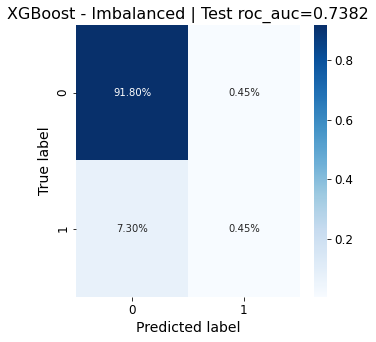

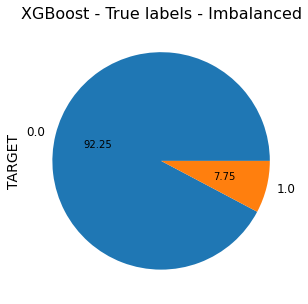

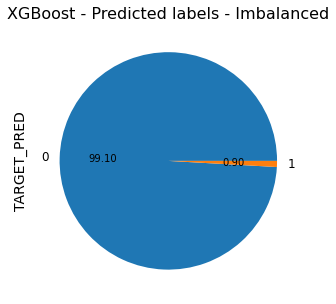

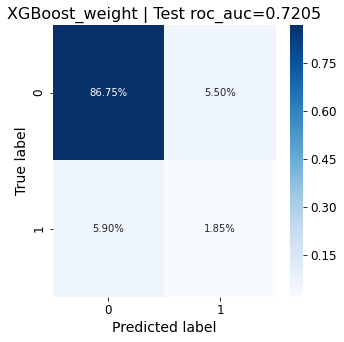

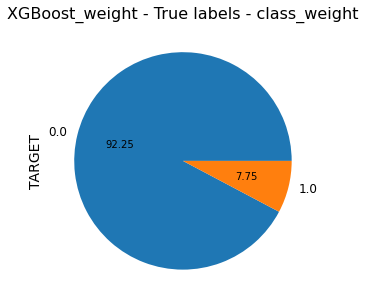

...

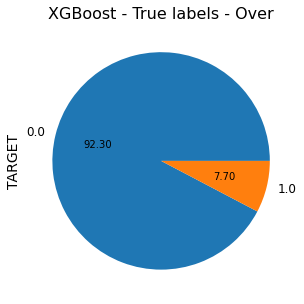

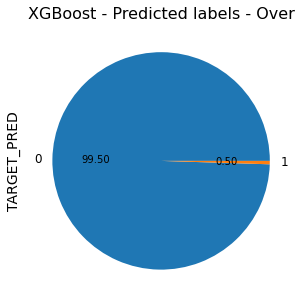

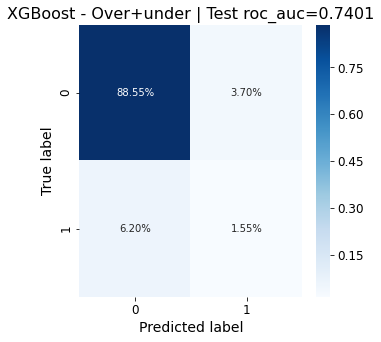

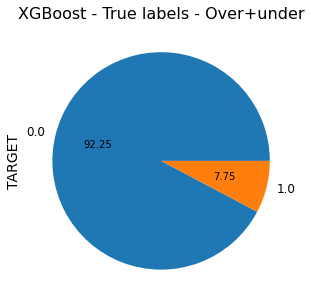

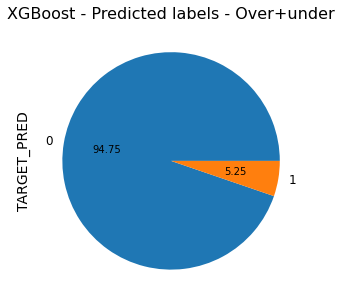

In [598]:
plt.rcParams['figure.figsize'] = [5, 5]
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
for label, mdl, df_doe, algos_results in [
    ["Imbalanced", best_mdl_imbal, df_doe_imbal, algos_results_imbal],
    ["class_weight", best_mdl_imbal, df_doe_imbal, algos_results_imbal],
    ["Under", best_mdl_under, df_doe_under, algos_results_under],
    ["Over", best_mdl_over, df_doe_over, algos_results_over],
    ["Over+under", best_mdl_over_under, df_doe_over_under, algos_results_over_under]
]:
#     score = 'Test custom_score'
    score = 'Test roc_auc'
#     score_max = df_doe[score].max()
#     winner = df_doe.loc[df_doe[score]==score_max]
#     ind_best_mdl = list(winner.index)[0]
    if label=='class_weight':
        ind_best_mdl = 9 # XGBoost imbalanced + StandardScaler #-1
    else:
        ind_best_mdl = 7 # XGBoost scale_pos_weight + StandardScaler
    problem = df_doe.iloc[ind_best_mdl]
    algo          = problem['Algorithm']['surname']
    res           = algos_results[ind_best_mdl]
    score_val     = problem[score]
    X_test        = res['X_test']
    y_test        = res['y_test']
    pipeline      = res['model'].best_estimator_
    # Test set
    class_test_pred = pipeline.predict(X_test)
    cf_matrix_test = confusion_matrix(y_test, class_test_pred)
    f1 = f1_score(y_test, class_test_pred)
#     print(cf_matrix_test)
    print(f"\n\n{algo} - {label} | ROC AUC: {score_val:.4f}")
    print(classification_report(y_test, class_test_pred))
    print(f"F1 score = {f1:.4f}")
    fig = plt.figure()
    sns.heatmap(cf_matrix_test/np.sum(cf_matrix_test), annot=True, fmt='.2%', cmap="Blues");
    plt.xlabel("Predicted label");
    plt.ylabel("True label");
    if label=='class_weight':
        title = f"{algo} | {score}={score_val:.4f}"
    else:
        title = f"{algo} - {label} | {score}={score_val:.4f}"
    plt.title(title);

    fig = plt.figure()
    y_test['TARGET'].value_counts().plot(kind='pie', autopct='%.2f')
    plt.title(f"{algo} - True labels - {label}");

    class_test_pred = pd.DataFrame(class_test_pred, columns=['TARGET_PRED'])
    fig = plt.figure()
    class_test_pred['TARGET_PRED'].value_counts().plot(kind='pie', autopct='%.2f')
    plt.title(f"{algo} - Predicted labels - {label}");
    

Le ROC AUC le taux de TP sont dégradés, mais le taux de TN est amélioré, on peut garder le `scale_pos_weight`.

#### Comparaison entre $\alpha$

In [610]:
df_doe_2 = pd.DataFrame(data=None, columns=['Algorithme', 'Gestion imbalance', 'Seuil', 'alpha', 'ROC AUC', 'Gain'])
for  label, mdl, df_doe, algos_results in [
    ["Imbalanced", best_mdl_imbal, df_doe_imbal, algos_results_imbal],
    ["Under", best_mdl_under, df_doe_under, algos_results_under],
    ["Over", best_mdl_over, df_doe_over, algos_results_over],
    ["Over+under", best_mdl_over_under, df_doe_over_under, algos_results_over_under]
]:
#     df_doe = df_doe.copy()
#     score = 'Test custom_score'
    score = 'Test roc_auc'
    for ind in range(df_doe.shape[0]):
        problem = df_doe.iloc[ind]
        res            = algos_results[ind]
        X_test         = res['X_test']
        y_test         = res['y_test']
        algo           = problem['Algorithm']['surname']
        scoring_data   = problem['Scoring data']
        score_function = scoring_data['score_function']
        threshold      = scoring_data['score_params']['threshold']
        alpha          = scoring_data['score_params']['alpha']
        if not alpha: alpha = 'N/A'
        roc_auc        = problem['Test roc_auc']
        gain           = problem['Test custom_score']
        df_doe_2 = pd.concat((df_doe_2,pd.DataFrame({
            'Algorithme': [algo], 
            'Gestion imbalance': [label],
            'Seuil': [threshold], 
            'alpha': [alpha],
            'ROC AUC': [roc_auc],
            'Gain': [gain]
        })))
        # Test set
        class_test_pred = mdl.predict(X_test)
        cf_matrix_test = confusion_matrix(y_test, class_test_pred)

df_doe_2 = df_doe_2.reset_index(drop=True)

In [611]:
df_doe_2

,Algorithme,Gestion imbalance,Seuil,alpha,ROC AUC,Gain
0,Dummy generous,Imbalanced,0.2,N/A,0.500000,276833.272500
1,Dummy generous,Imbalanced,0.2,N/A,0.500000,276833.272500
2,Gaussian Naive Bayes,Imbalanced,0.2,N/A,0.507924,24141.863250
3,Gaussian Naive Bayes,Imbalanced,0.2,N/A,0.508676,19126.210500
4,Logistic,Imbalanced,0.2,N/A,0.717203,276961.619250
5,Logistic,Imbalanced,0.2,N/A,0.746355,261777.856500
6,XGBoost,Imbalanced,0.2,N/A,0.749464,272091.060000
7,XGBoost,Imbalanced,0.2,N/A,0.738215,271550.074500
8,XGBoost_weight,Imbalanced,0.2,N/A,0.708454,218616.504750
9,XGBoost_weight,Imbalanced,0.2,N/A,0.720532,219752.280000


#### Work

In [178]:
df_doe_work

,Algorithm,Encoder,Scaler,Variables,Scoring data,Best params,Scoring,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time,Train custom_score,Test custom_score
0,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...","{'score_function': 'roc_auc', 'greater_is_bett...",{},roc_auc,0.500000,N/A,0.50000,N/A,10.300486,NaN,NaN
1,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,6.912653,1.329448e+10,3.326851e+09
2,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,5.864038,1.386254e+09,3.465468e+08
3,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,5.359807,1.253351e+09,3.133045e+08
4,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,5.124045,1.120448e+09,2.800621e+08
5,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,5.038410,8.546423e+08,2.135773e+08
6,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,4.950771,1.901278e+08,4.736540e+07
7,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,4.298520,1.329448e+10,3.326851e+09
8,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,4.881415,1.386254e+09,3.465468e+08
9,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,0.500000,N/A,0.50000,N/A,4.443509,1.253351e+09,3.133045e+08


In [612]:
df_doe_2 = pd.DataFrame(data=None, columns=['Algorithme', 'Gestion imbalance', 'Seuil', 'alpha', 'ROC AUC', 'Gain'])
for  label, mdl, df_doe, algos_results in [
    ["Imbalanced", best_mdl_work, df_doe_work, algos_results_work],
]:
    for ind in range(df_doe.shape[0]):
        problem = df_doe.iloc[ind]
        res            = algos_results[ind]
        X_test         = res['X_test']
        y_test         = res['y_test']
        algo           = problem['Algorithm']['surname']
        scoring_data   = problem['Scoring data']
        score_function = scoring_data['score_function']
        threshold      = scoring_data['score_params']['threshold']
        alpha          = scoring_data['score_params']['alpha']
        if not alpha: alpha = 'N/A'
        roc_auc        = problem['Test roc_auc']
        gain           = problem['Test custom_score']
        model         = res['model'].best_estimator_['model']
        pipeline      = res['model'].best_estimator_
        df_doe_2 = pd.concat((df_doe_2,pd.DataFrame({
            'Algorithme': [algo], 
            'Gestion imbalance': [label],
            'Seuil': [threshold], 
            'alpha': [alpha],
            'ROC AUC': [roc_auc],
            'Gain': [gain]
        })))
        # Test set
        class_test_pred = pipeline.predict(X_test)
        cf_matrix_test = confusion_matrix(y_test, class_test_pred)
df_doe_2 = df_doe_2.reset_index(drop=True)

### Courbe ROC AUC

In [119]:
def generate_auc_roc_curve(clf, X_test, y_test, title=''):
    y_pred_proba = clf.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    auc = roc_auc_score(y_test, y_pred_proba)
    fig = plt.figure()
    plt.plot(fpr, tpr)
    plt.title(title+f"{auc:.4f}");
    plt.grid('on')
    plt.show()

In [ ]:
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
for  label, mdl, df_doe, algos_results in [
    ["Imbalanced", best_mdl_imbal, df_doe_imbal, algos_results_imbal],
    ["class_weight", best_mdl_imbal, df_doe_imbal, algos_results_imbal],
    ["Under", best_mdl_under, df_doe_under, algos_results_under],
    ["Over", best_mdl_over, df_doe_over, algos_results_over],
    ["Over+under", best_mdl_over_under, df_doe_over_under, algos_results_over_under]
]:
    if label=='class_weight':
        ind_mdl = 9 # XGBoost imbalanced + StandardScaler #-1
    else:
        ind_mdl = 7 # XGBoost scale_pos_weight + StandardScaler
    problem = df_doe.iloc[ind_mdl] 
    algo          = problem['Algorithm']['surname']
    res           = algos_results[ind_mdl]
    X_test        = res['X_test']
    y_test        = res['y_test']
    model         = res['model'].best_estimator_['model']
    pipeline      = res['model'].best_estimator_
    title = f"{algo} | {label} | ROC AUC = "
    generate_auc_roc_curve(pipeline, X_test, y_test, title=title)

### Courbe F1

In [122]:
def generate_F1_curve(clf, X_test, y_test, title=''):
    y_pred_proba = clf.predict_proba(X_test)[:, 1]
    
    threshold_array = np.linspace(0, 1, 100)
    f1_list = []
    for threshold in threshold_array:
        # Labels prédits pour un seuil donné
        label_pred_threshold = (y_pred_proba > threshold).astype(int)
        # Calcul du f1 pour un seuil donné
        f1_threshold = f1_score(y_true=y_test, y_pred=label_pred_threshold)
        f1_list.append(f1_threshold)
        
    f1_list = np.array(f1_list)
    fig = plt.figure()
    plt.plot(threshold_array, f1_list)
    plt.title(title+f"{f1_list.max():.4f}");
    plt.grid('on')
    plt.show()

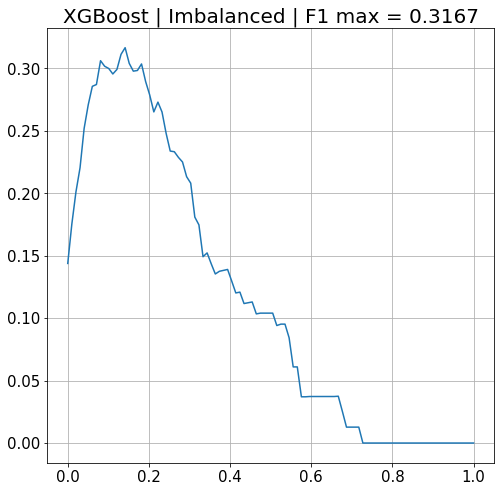

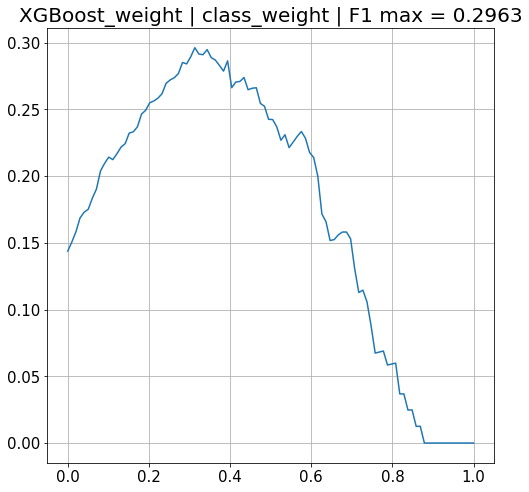

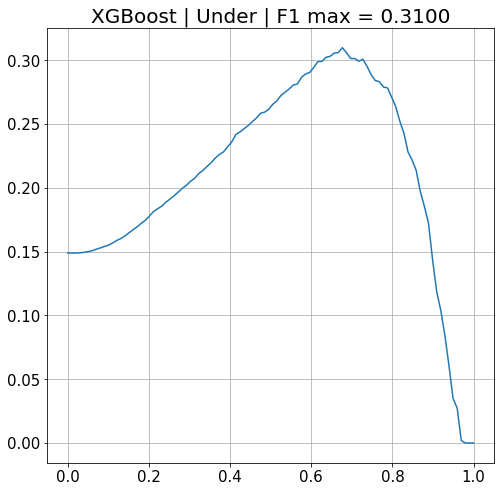

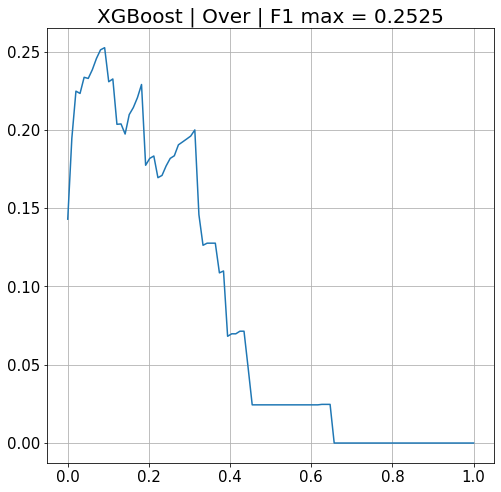

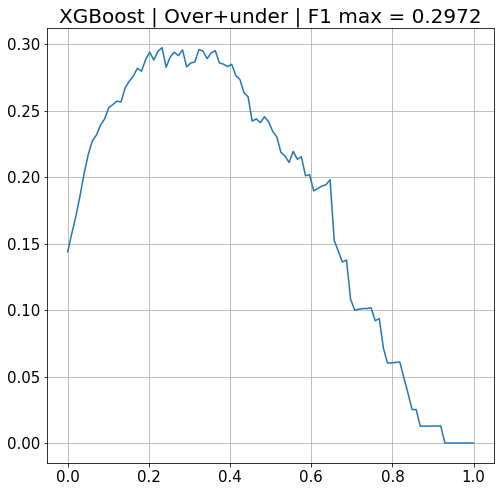

In [567]:
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
for  label, mdl, df_doe, algos_results in [
    ["Imbalanced", best_mdl_imbal, df_doe_imbal, algos_results_imbal],
    ["class_weight", best_mdl_imbal, df_doe_imbal, algos_results_imbal],
    ["Under", best_mdl_under, df_doe_under, algos_results_under],
    ["Over", best_mdl_over, df_doe_over, algos_results_over],
    ["Over+under", best_mdl_over_under, df_doe_over_under, algos_results_over_under]
]:
    if label=='class_weight':
        ind_mdl = 9 # XGBoost imbalanced + StandardScaler #-1
    else:
        ind_mdl = 7 # XGBoost scale_pos_weight + StandardScaler
    problem = df_doe.iloc[ind_mdl] 
    algo          = problem['Algorithm']['surname']
    res           = algos_results[ind_mdl]
    X_test        = res['X_test']
    y_test        = res['y_test']
    model         = res['model'].best_estimator_['model']
    pipeline      = res['model'].best_estimator_
    title = f"{algo} | {label} | F1 max = "
    generate_F1_curve(pipeline, X_test, y_test, title=title)

### Score métier en fonction du seuil

#### Comparaison entre $\alpha$

**********
Algo : Dummy generous | gestion d'imbalance = Imbalanced
gain max = 274002.6645 pour seuil = 0.56
**********

**********
Algo : XGBoost | gestion d'imbalance = Imbalanced
gain max = 275191.2495 pour seuil = 0.52
**********

**********
Algo : Dummy generous | gestion d'imbalance = class_weight
gain max = 274002.6645 pour seuil = 0.52
**********

**********
Algo : XGBoost_weight | gestion d'imbalance = class_weight
gain max = 274002.6645 pour seuil = 0.92
**********

**********
Algo : Dummy generous | gestion d'imbalance = Under
gain max = 265815.4902822581 pour seuil = 0.92
**********

**********
Algo : XGBoost | gestion d'imbalance = Under
gain max = 266347.9143145161 pour seuil = 0.94
**********

**********
Algo : Dummy generous | gestion d'imbalance = Over
gain max = 264339.0765 pour seuil = 0.94
**********

**********
Algo : XGBoost | gestion d'imbalance = Over
gain max = 264585.708 pour seuil = 0.44
**********

**********
Algo : Dummy generous | gestion d'imbalance = Ove

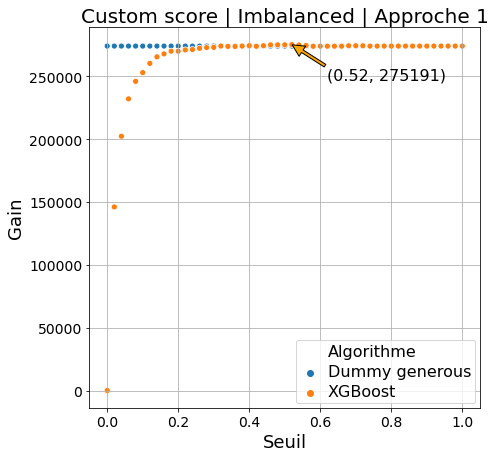

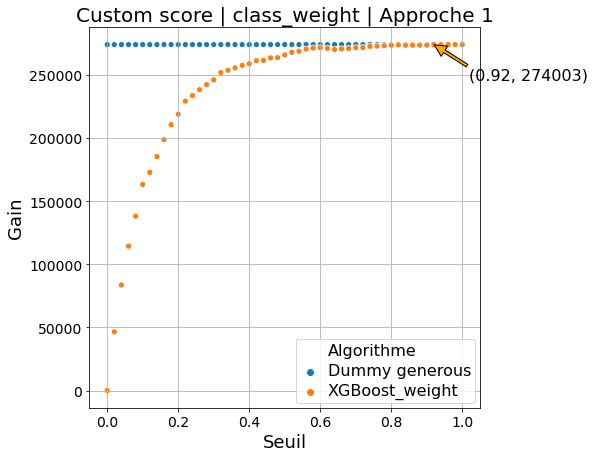

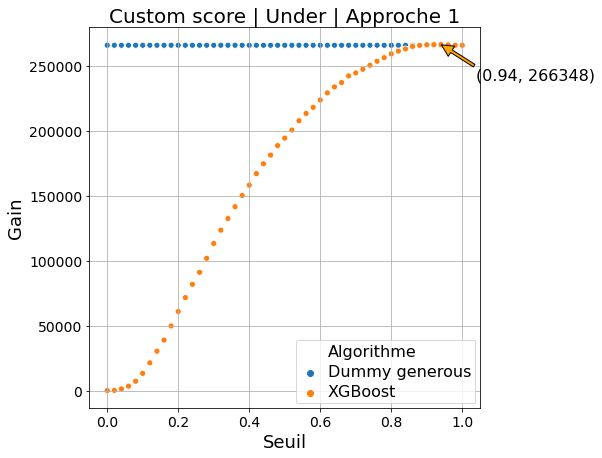

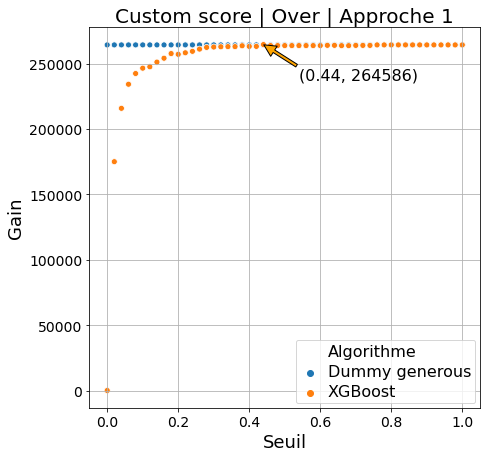

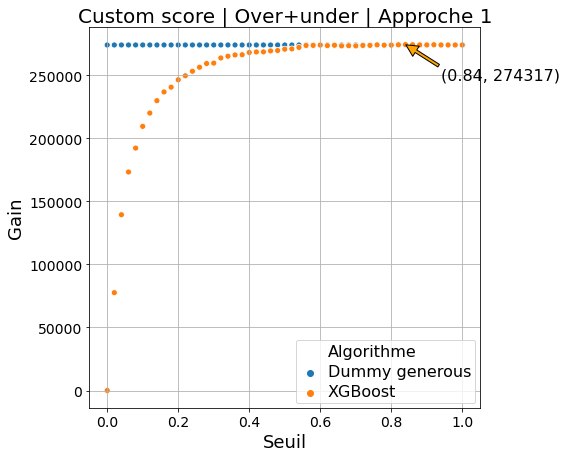

In [570]:
plt.rcParams['figure.figsize'] = [7, 7]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
overall_best_gain = -np.inf
overall_best_threshold = None
overall_best_rebalancer = None
for  label, mdl, df_doe, algos_results in [
    ["Imbalanced", best_mdl_imbal, df_doe_imbal, algos_results_imbal],
    ["class_weight", best_mdl_imbal, df_doe_imbal, algos_results_imbal],
    ["Under", best_mdl_under, df_doe_under, algos_results_under],
    ["Over", best_mdl_over, df_doe_over, algos_results_over],
    ["Over+under", best_mdl_over_under, df_doe_over_under, algos_results_over_under]
]:
#     score = 'Test custom_score'
#     score = 'Test roc_auc'
#     winner = df_doe.loc[df_doe[score]==df_doe[score].max()]
#     ind_mdl = list(winner.index)[0]
#     ind_mdl = -1
    df_etude_param_seuil = pd.DataFrame(columns=['Seuil', 'Gain', 'Algorithme'])
#     for ind_mdl in [0, -1]: # Premier dummy et dernier XGBoost

    if label=='class_weight':
        ind_max = 9 # XGBoost imbalanced + StandardScaler #-1
    else:
        ind_max = 7 # XGBoost scale_pos_weight + StandardScaler
    for ind_mdl in [0, ind_max]: # Premier dummy et XGBoost StandardScaler
        problem = df_doe.iloc[ind_mdl]
        algo          = problem['Algorithm']['surname']
        res           = algos_results[ind_mdl]
        X_test        = res['X_test']
        y_test        = res['y_test']
        model         = res['model'].best_estimator_['model']
        pipeline      = res['model'].best_estimator_
        class_test_proba = pipeline.predict_proba(X_test)
        y_test_proba = pd.Series(class_test_proba[:,1], name='y_test_proba', index=y_test.index)

        gain = []
#         alpha = 3.
        alpha = None
        seuil = [s/100. for s in range(0, 101, 2)]
        y_test = y_test['TARGET']
        gain = [custom_metric_threshold(y_test, y_test_proba, X_train=train_df, threshold=s, alpha=alpha) for s in seuil]
        if algo.startswith('XGBoost'):
            gain_max = np.array(gain).max()
            ind_gain_max = np.array(gain).argmax()
            seuil = np.array(seuil)
            seuil_optimal = seuil[ind_gain_max]
            if gain_max > overall_best_gain:
                overall_best_gain = gain_max
                overall_best_threshold = seuil_optimal
                overall_best_rebalancer = label
        print(f"**********")
        print(f"Algo : {algo} | gestion d'imbalance = {label}")
        print(f"gain max = {gain[ind_gain_max]} pour seuil = {seuil_optimal}")
        print(f"**********\n")
        
        df_w = pd.DataFrame()
        df_w['Seuil'] = seuil
        df_w['Gain'] = gain
        df_w['Algorithme'] = algo
        df_etude_param_seuil = pd.concat((df_etude_param_seuil, df_w))

    # Affichage
    fig = plt.figure()
    ax = sns.scatterplot(data=df_etude_param_seuil, x='Seuil', y='Gain', hue='Algorithme')
    ax.annotate(f"({seuil_optimal}, {gain_max:.0f})", xy=(seuil_optimal, gain_max), xytext=(seuil_optimal+0.1, gain_max*0.9), fontsize=16,
            arrowprops=dict(facecolor='orange', width=3, shrink=0.01))
    plt.setp(ax.get_legend().get_texts(), fontsize='16')
    plt.grid('on')
    tt2 = 'Approche 1'
    if not alpha is None: tt2 = f"Approche 2 (α={alpha})"
    plt.title(f"Custom score | {label} | "+tt2);

print(f"Meilleur modèle final : {overall_best_rebalancer}")
print(f"Meilleur seuil final  : {overall_best_threshold}")
print(f"Meilleur gain final   : {overall_best_gain}")

# Sélection de la meilleure combinaison algorithme / scaler / seuil / ...

In [613]:
df_doe = df_doe_under
algos_results = algos_results_under

In [614]:
df_doe

,Algorithm,Encoder,Scaler,Variables,Scoring data,Best params,Scoring,Train custom_score,Test custom_score,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time,Imbalance manager
0,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,268044.733124,268294.419073,0.500000,N/A,0.500000,N/A,3.250082,Under
1,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,268044.733124,268294.419073,0.500000,N/A,0.500000,N/A,3.632241,Under
2,"{'surname': 'Gaussian Naive Bayes', 'class': G...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,184008.415874,181381.123669,0.639993,N/A,0.629909,N/A,3.524897,Under
3,"{'surname': 'Gaussian Naive Bayes', 'class': G...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,181459.427174,178332.932177,0.640310,N/A,0.630080,N/A,3.847800,Under
4,"{'surname': 'Logistic', 'class': LogisticRegre...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__C': 0.01, 'model__class_weight': None...",roc_auc,4695.620529,3684.883790,0.737930,N/A,0.723318,N/A,8.900666,Under
5,"{'surname': 'Logistic', 'class': LogisticRegre...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__C': 0.01, 'model__class_weight': None...",roc_auc,41035.252671,38982.737540,0.759590,N/A,0.742684,N/A,11.650566,Under
6,"{'surname': 'XGBoost', 'class': XGBClassifier(...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,72084.993911,61923.520161,0.899074,N/A,0.755680,N/A,41.227903,Under
7,"{'surname': 'XGBoost', 'class': XGBClassifier(...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,72701.690885,63496.219355,0.897459,N/A,0.756711,N/A,43.314825,Under
8,"{'surname': 'XGBoost_weight', 'class': XGBClas...",None,<class 'sklearn.preprocessing._data.MinMaxScal...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,12968.869985,10791.214839,0.916493,N/A,0.740852,N/A,42.185882,Under
9,"{'surname': 'XGBoost_weight', 'class': XGBClas...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,13457.578168,11706.589960,0.917112,N/A,0.739168,N/A,41.351720,Under


In [615]:
# score = 'Test custom_score'
score = 'Test roc_auc'
best_score = df_doe[score].max()
# winner = df_doe.loc[df_doe[score]==best_score]
# ind_best_mdl = list(winner.index)[0]
# winner
ind_best_mdl = 7

In [616]:
problem = df_doe.iloc[ind_best_mdl]
res           = algos_results[ind_best_mdl] # int(winner.index.values)
algo          = problem['Algorithm']['surname']
X_train       = res['X_train']
y_train       = res['y_train']
X_test        = res['X_test']
y_test        = res['y_test']
y_train_pred  = res['y_train_pred']
y_test_pred   = res['y_test_pred']
feat_cols     = problem['Variables']['categ_cols'] + problem['Variables']['num_cols']
feat_cols_enc = res['Column names']
model         = res['model'].best_estimator_['model']
pipeline      = res['model'].best_estimator_

s = f"{algo} | {model} :\n"
print(s+'-'*(min(124,len(s)-3)))

XGBoost | XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=0.5, colsample_bynode=1, colsample_bytree=0.8,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.05, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=10, max_depth=5, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=500,
              n_jobs=10, nthread=10, num_parallel_tree=1, predictor='auto',
              random_state=18011975, reg_alpha=0, ...) :
----------------------------------------------------------------------------------------------------------------------------


## Modèle final

In [124]:
algos_clf = [
    {'surname': 'Dummy generous',
     'class': DummyClassifier(strategy='constant', constant=0), # On prédit tous les clients à Négatif
     'param_grid': param_grid_dumgen},
    {'surname': 'XGBoost',
    'class': XGBClassifier(), # 
    'param_grid': param_grid_xgbc},
]

scalers = [StandardScaler]
encoders = [None] # L'encadage est fait dans le préprocessing des données

scores = ['roc_auc'] # ['roc_auc', 'precision', 'recall', 'f1']

scoring_data = [
    {'score_function': custom_metric_threshold,
     'greater_is_better': True,
     'needs_proba': True,
     'score_params': {'X_train': train_df,
                      'threshold': 0.80,
                      'alpha': 3.}},
]

# Under
df_doe_init_final = build_doe(algos_clf, encoders, scalers, models_cols, scoring_data)
train_df_final = train_df

In [125]:
##################
# UNDER
##################
print(train_df_final.shape)
df_doe_final, algos_results_final, s, best_mdl_final, best_mdl_name = \
        MLstuff.classification_doe(train_df_final, df_doe_init_final,
                                   target_col, problem_kind,
                                   scores,
                                   oversampling=False, undersampling='RandomUnderSampler',
                                   predict_proba=True, class_to_predict=1,
                                   encode_y=False)
df_doe_final

(307507, 276)
Taille du dataset de classification  : (307507, 276)
Taille du dataset d'entrainement : (246005, 274)

Algorithme Dummy generous :
---------------------------

None
y_train.value_counts() = 0.0    226145
1.0     19860
Name: TARGET, dtype: int64
Resampling dataset...
Dataset resampled.
y_train_temp.value_counts() = 0.0    19860
1.0    19860
Name: TARGET, dtype: int64
+++ AVEC undersampling seulement
y_train_pred = [0. 0. 0. ... 0. 0. 0.]
y_test_pred =         TARGET_pred
147489          0.0
102526          0.0
6563            0.0
108012          0.0
196444          0.0
...             ...
124142          0.0
220895          0.0
160193          0.0
243209          0.0
201964          0.0

[61502 rows x 1 columns]
score = roc_auc
score_str = roc_auc
Meilleurs hyperparamètres sur le jeu d'entraînement : {}. Score (val) : 2.255e+04
4: 0
{}
Taille du dataset d'entrainement : (246005, 274)

Algorithme XGBoost :
--------------------

None
y_train.value_counts() = 0.0    226145
1.

,Algorithm,Encoder,Scaler,Variables,Scoring data,Best params,Scoring,Train custom_score,Test custom_score,Train roc_auc,Train relative roc_auc,Test roc_auc,Test relative roc_auc,Elapsed time
0,"{'surname': 'Dummy generous', 'class': DummyCl...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,{},roc_auc,22552.848865,22552.980033,0.500000,N/A,0.500000,N/A,30.108391
1,"{'surname': 'XGBoost', 'class': XGBClassifier(...",None,<class 'sklearn.preprocessing._data.StandardSc...,"{'categ_cols': [], 'num_cols': ['CODE_GENDER_N...",{'score_function': <function custom_metric_thr...,"{'model__colsample_bylevel': 0.5, 'model__cols...",roc_auc,23731.232341,23174.186222,0.826819,N/A,0.777465,N/A,275.689163


In [127]:
%store df_doe_final
%store algos_results_final
%store best_mdl_final

Stored 'df_doe_final' (DataFrame)
Stored 'algos_results_final' (list)
Stored 'best_mdl_final' (Pipeline)




XGBoost - Under | ROC AUC: 0.7775
              precision    recall  f1-score   support

         0.0       0.96      0.71      0.82     56537
         1.0       0.17      0.71      0.28      4965

    accuracy                           0.71     61502
   macro avg       0.57      0.71      0.55     61502
weighted avg       0.90      0.71      0.77     61502

F1 score = 0.2798


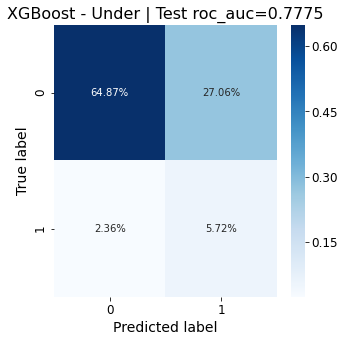

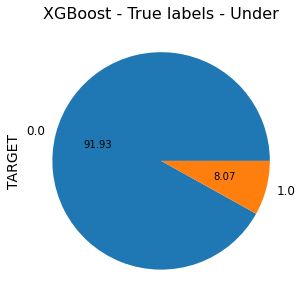

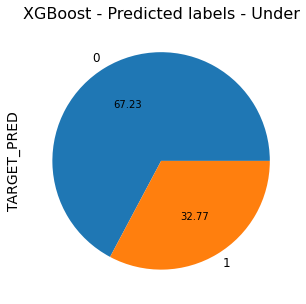

In [128]:
plt.rcParams['figure.figsize'] = [5, 5]
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
for label, mdl, df_doe, algos_results in [
    ["Under", best_mdl_final, df_doe_final, algos_results_final],
]:
    score = 'Test roc_auc'
    ind_best_mdl = 1
    problem = df_doe.iloc[ind_best_mdl]
    algo          = problem['Algorithm']['surname']
    res           = algos_results[ind_best_mdl]
    score_val     = problem[score]
    X_test        = res['X_test']
    y_test        = res['y_test']
    pipeline      = res['model'].best_estimator_
    # Test set
    class_test_pred = pipeline.predict(X_test)
    cf_matrix_test = confusion_matrix(y_test, class_test_pred)
    f1 = f1_score(y_test, class_test_pred)
    print(f"\n\n{algo} - {label} | ROC AUC: {score_val:.4f}")
    print(classification_report(y_test, class_test_pred))
    print(f"F1 score = {f1:.4f}")
    fig = plt.figure()
    sns.heatmap(cf_matrix_test/np.sum(cf_matrix_test), annot=True, fmt='.2%', cmap="Blues");
    plt.xlabel("Predicted label");
    plt.ylabel("True label");
    if label=='class_weight':
        title = f"{algo} | {score}={score_val:.4f}"
    else:
        title = f"{algo} - {label} | {score}={score_val:.4f}"
    plt.title(title);

    fig = plt.figure()
    y_test['TARGET'].value_counts().plot(kind='pie', autopct='%.2f')
    plt.title(f"{algo} - True labels - {label}");

    class_test_pred = pd.DataFrame(class_test_pred, columns=['TARGET_PRED'])
    fig = plt.figure()
    class_test_pred['TARGET_PRED'].value_counts().plot(kind='pie', autopct='%.2f')
    plt.title(f"{algo} - Predicted labels - {label}");
    

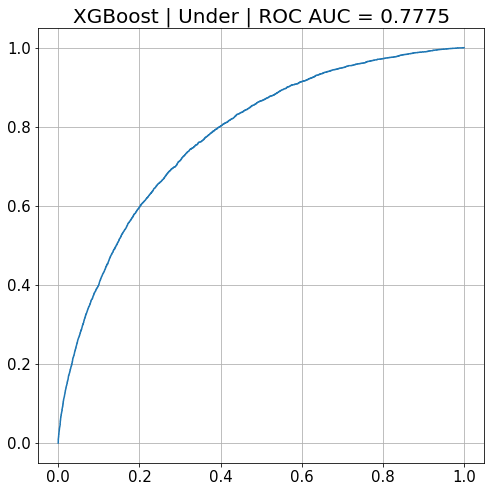

In [135]:
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
for  label, mdl, df_doe, algos_results in [
    ["Under", best_mdl_final, df_doe_final, algos_results_final],
]:
    ind_mdl = 1
    problem = df_doe.iloc[ind_mdl] 
    algo          = problem['Algorithm']['surname']
    res           = algos_results[ind_mdl]
    X_test        = res['X_test']
    y_test        = res['y_test']
    model         = res['model'].best_estimator_['model']
    pipeline      = res['model'].best_estimator_
    title = f"{algo} | {label} | ROC AUC = "
    generate_auc_roc_curve(pipeline, X_test, y_test, title=title)

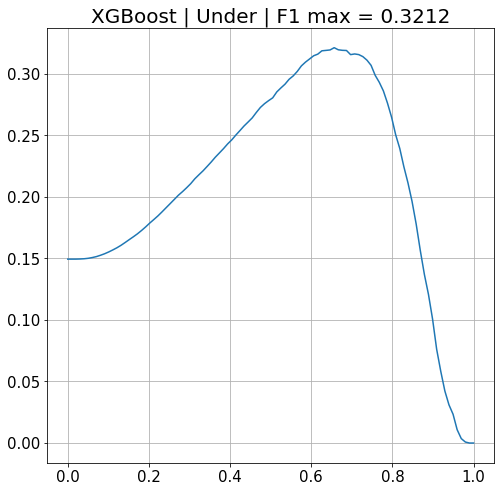

In [129]:
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
for  label, mdl, df_doe, algos_results in [
    ["Under", best_mdl_final, df_doe_final, algos_results_final],
]:
    ind_mdl = 1
    problem = df_doe.iloc[ind_mdl] 
    algo          = problem['Algorithm']['surname']
    res           = algos_results[ind_mdl]
    X_test        = res['X_test']
    y_test        = res['y_test']
    model         = res['model'].best_estimator_['model']
    pipeline      = res['model'].best_estimator_
    title = f"{algo} | {label} | F1 max = "
    generate_F1_curve(pipeline, X_test, y_test, title=title)

[22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653, 22552.980033169653,

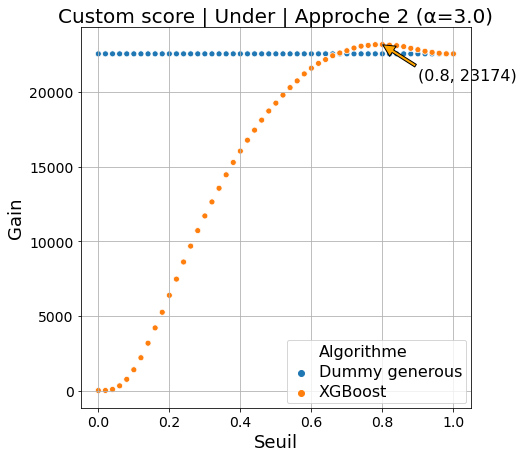

In [134]:
plt.rcParams['figure.figsize'] = [7, 7]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
overall_best_gain = -np.inf
overall_best_threshold = None
overall_best_rebalancer = None
for  label, mdl, df_doe, algos_results in [
    ["Under", best_mdl_final, df_doe_final, algos_results_final],
]:
    df_etude_param_seuil = pd.DataFrame(columns=['Seuil', 'Gain', 'Algorithme'])
    ind_max = 1 # XGBoost scale_pos_weight + StandardScaler
    for ind_mdl in [0, ind_max]: # Premier dummy et XGBoost StandardScaler
        problem = df_doe.iloc[ind_mdl]
        algo          = problem['Algorithm']['surname']
        res           = algos_results[ind_mdl]
        X_test        = res['X_test']
        y_test        = res['y_test']
        model         = res['model'].best_estimator_['model']
        pipeline      = res['model'].best_estimator_
        class_test_proba = pipeline.predict_proba(X_test)
        y_test_proba = pd.Series(class_test_proba[:,1], name='y_test_proba', index=y_test.index)

        gain = []
#         alpha = None
        alpha = 3.
        seuil = [s/100. for s in range(0, 101, 2)]
        y_test = y_test['TARGET']
        gain = [custom_metric_threshold(y_test, y_test_proba, X_train=train_df, threshold=s, alpha=alpha) for s in seuil]
        print(gain)
        if algo.startswith('XGBoost'):
            gain_max = np.array(gain).max()
            ind_gain_max = np.array(gain).argmax()
            seuil = np.array(seuil)
            seuil_optimal = seuil[ind_gain_max]
            if gain_max > overall_best_gain:
                overall_best_gain = gain_max
                overall_best_threshold = seuil_optimal
                overall_best_rebalancer = label
        else:
            ind_gain_max = 0
            seuil_optimal = 0.
        print(f"**********")
        print(f"Algo : {algo} | gestion d'imbalance = {label}")
        print(f"gain max = {gain[ind_gain_max]} pour seuil = {seuil_optimal}")
        print(f"**********\n")
        
        df_w = pd.DataFrame()
        df_w['Seuil'] = seuil
        df_w['Gain'] = gain
        df_w['Algorithme'] = algo
        df_etude_param_seuil = pd.concat((df_etude_param_seuil, df_w))

    # Affichage
    fig = plt.figure()
    ax = sns.scatterplot(data=df_etude_param_seuil, x='Seuil', y='Gain', hue='Algorithme')
    ax.annotate(f"({seuil_optimal}, {gain_max:.0f})", xy=(seuil_optimal, gain_max), xytext=(seuil_optimal+0.1, gain_max*0.9), fontsize=16,
            arrowprops=dict(facecolor='orange', width=3, shrink=0.01))
    plt.setp(ax.get_legend().get_texts(), fontsize='16')
    plt.grid('on')
    tt2 = 'Approche 1'
    if not alpha is None: tt2 = f"Approche 2 (α={alpha})"
    plt.title(f"Custom score | {label} | "+tt2);

print(f"Meilleur modèle final : {overall_best_rebalancer}")
print(f"Meilleur seuil final  : {overall_best_threshold}")
print(f"Meilleur gain final   : {overall_best_gain}")

# Interprétation du modèle

In [617]:
import shap

In [618]:
shap.initjs()

## Explainer

In [619]:
if algo in ['XGBoost', 'XGBoost_weight', 'LightGBM', 'RandomForest']:
    explainer = shap.TreeExplainer(pipeline.named_steps["model"]) # GradientExplainer
elif algo in ['Logistic']:
    explainer = shap.LinearExplainer(pipeline.named_steps["model"]) # GradientExplainer
else:
    print("*** Algo pas prévu.")

## Prédiction sur test_df (dataset de la compétition)

In [620]:
test_df = test_df.copy()
test_df_X = test_df.drop(['SK_ID_CURR', 'TARGET'], axis=1)
test_df['TARGET'] = pipeline.predict_proba(test_df_X)[:,1]

In [673]:
risk_threshold = 0.80 # 0.18

In [674]:
test_df['APPROVED'] = test_df['TARGET']<=risk_threshold

## Feature importance "built-in"

In [675]:
# feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
feature_importance_df = pd.DataFrame()
feature_importance_df["feature"] = feat_cols
feature_importance_df["importance"] = model.feature_importances_


In [676]:
feature_importance_df.to_csv(f"feature_importance_{algo}_{score}={best_score:.3f}.csv", sep=";", index=False)

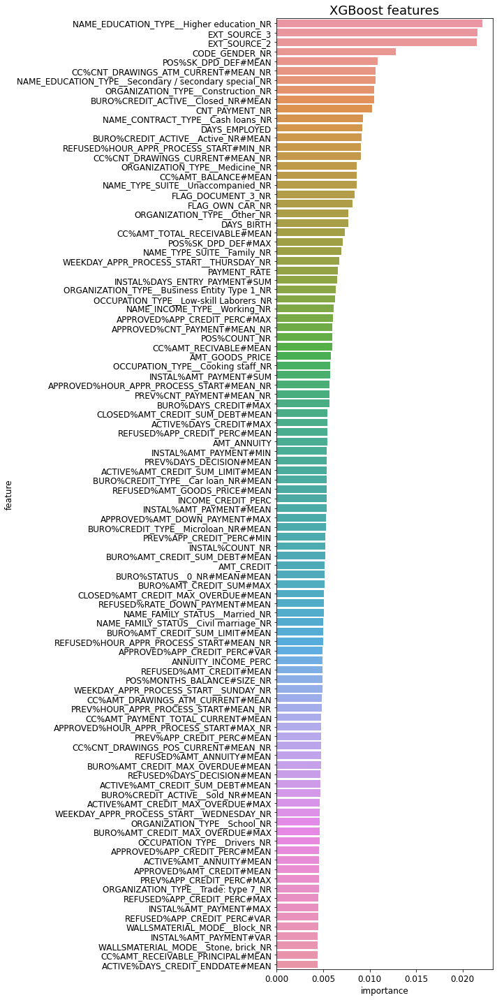

In [677]:
plt.rcParams['figure.figsize'] = [10, 20]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
display_importances(feature_importance_df, n_feat=100, algo_name=algo)

## N samples pris au hasard

In [678]:
N = 100

In [679]:
X_sampled = X_train.sample(N, random_state=18011975)

In [680]:
if algo in ['XGBoost', 'XGBoost_weight', 'LightGBM', 'RandomForest']:
    shap_values = explainer.shap_values(X_sampled, check_additivity=False)
elif algo in ['Logistic']:
    shap_values = explainer.shap_values(X_sampled)
else:
    print("*** Algo pas prévu.")

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [681]:
shap.force_plot(explainer.expected_value, shap_values, X_train)

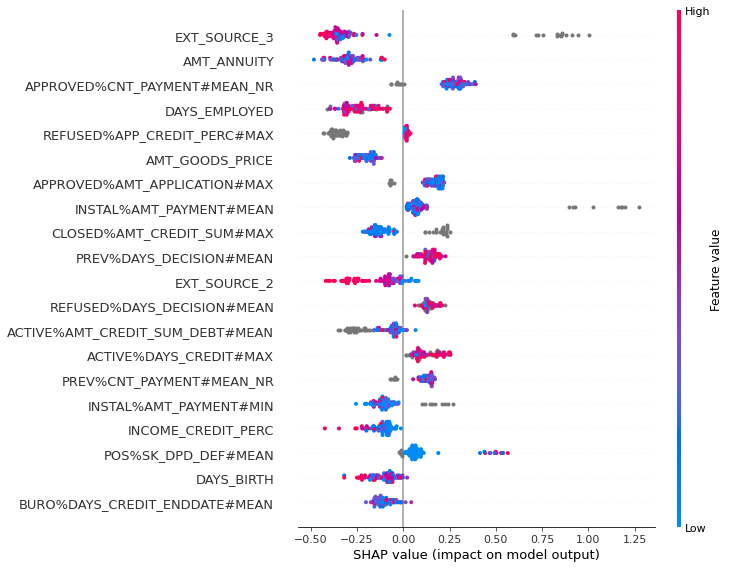

In [682]:
shap.summary_plot(shap_values, X_sampled)

### Un de ces samples

In [683]:
client_shape_values = explainer.shap_values(X_sampled.sample(1))[0]
feature_names = X_train.columns
%store client_shape_values
%store feature_names

Stored 'client_shape_values' (ndarray)
Stored 'feature_names' (Index)


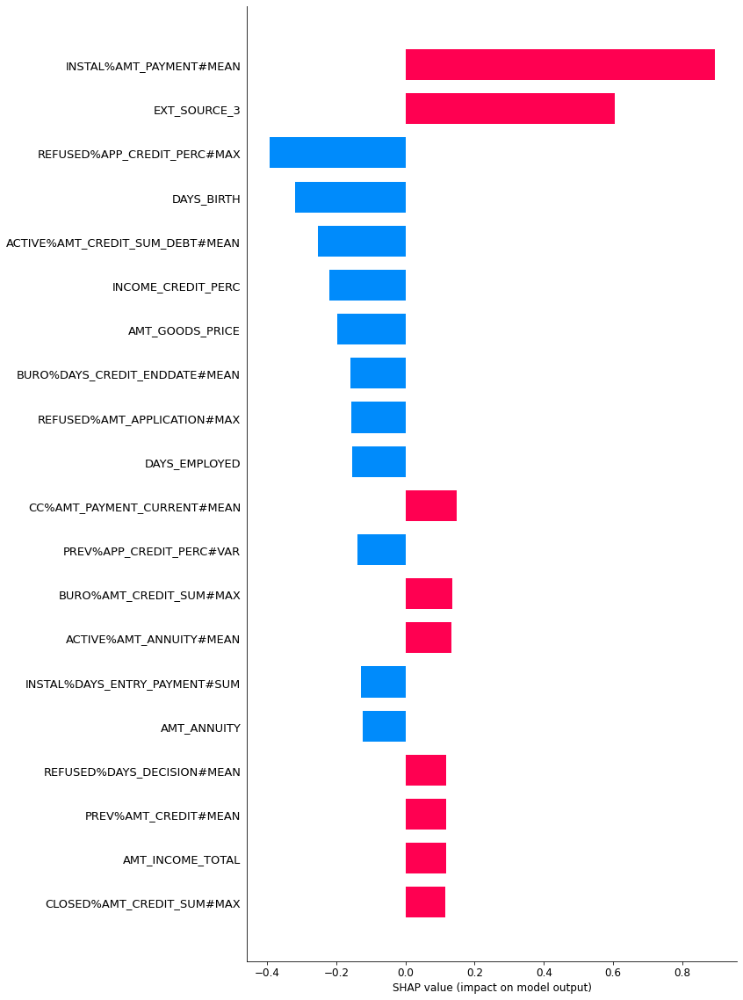

In [684]:
plt.rcParams['figure.figsize'] = [10, 20]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
shap.bar_plot(explainer.shap_values(X_sampled.sample(1))[0],
             feature_names=X_train.columns,
             max_display=20)

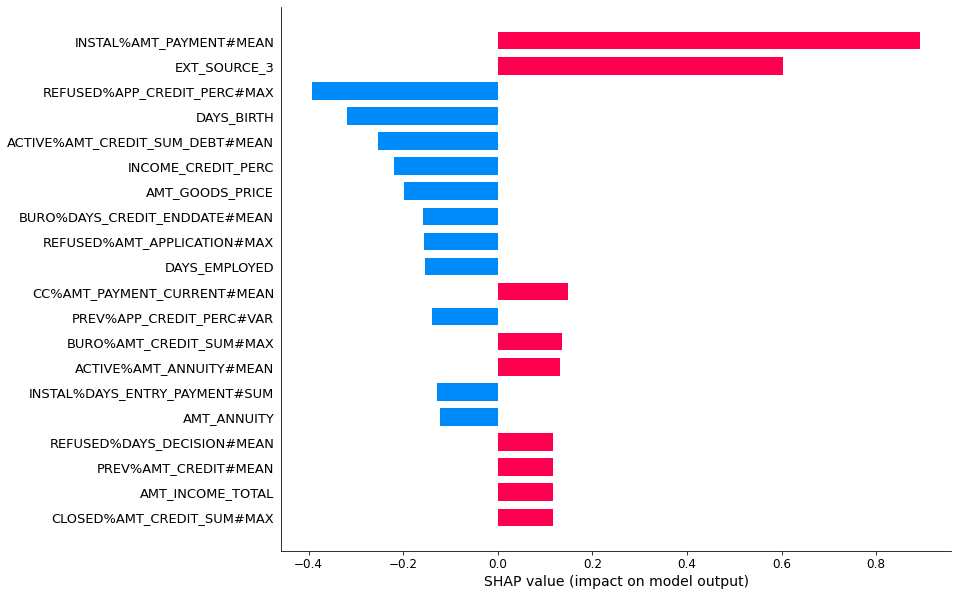

In [685]:
plt.rcParams['figure.figsize'] = [12, 10]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
shap.bar_plot(explainer.shap_values(X_sampled)[0],
             feature_names=X_train.columns,
             max_display=20)

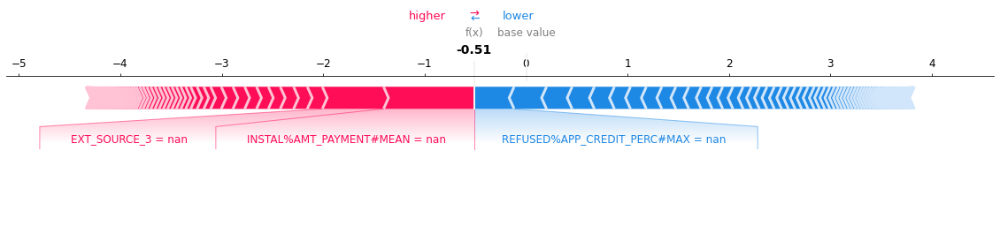

In [686]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X_sampled.iloc[0,:], matplotlib=True)

### Feature importance

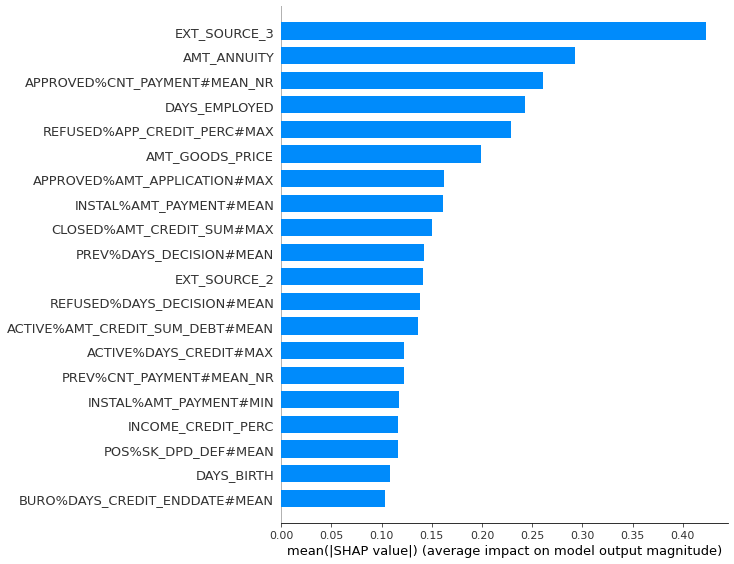

In [687]:
plt.rcParams['figure.figsize'] = [8, 6]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
shap.summary_plot(shap_values, X_sampled, plot_type="bar")

#### Regroupement des valeurs catégorielles

In [688]:
if 0 :
    # On moyenne sur les points samplés
    shap_values_moy = abs(shap_values).mean(axis=0)
    grouped_influences = PwePwocess.influenceCatVal(feat_cols, shap_values_moy, sep='$') # Relancer l'OneHot avec un '$' comme sép
    df_fi = pd.Series(grouped_influences)

    plt.rcParams['figure.figsize'] = [12, 8]
    plt.rcParams['axes.titlesize'] = 20
    plt.rcParams['axes.labelsize'] = 15
    plt.rcParams['xtick.labelsize'] = 15
    plt.rcParams['ytick.labelsize'] = 15

    df_fi.plot(kind='barh',color='firebrick',figsize=(8,6)) # firebrick, salmon
    plt.xlabel('mean(|SHAP value|, grouped for categorial features)');
    plt.title(f'Feature importances on {target_col}');
    plt.grid('on')
    plt.show()
    df_fi

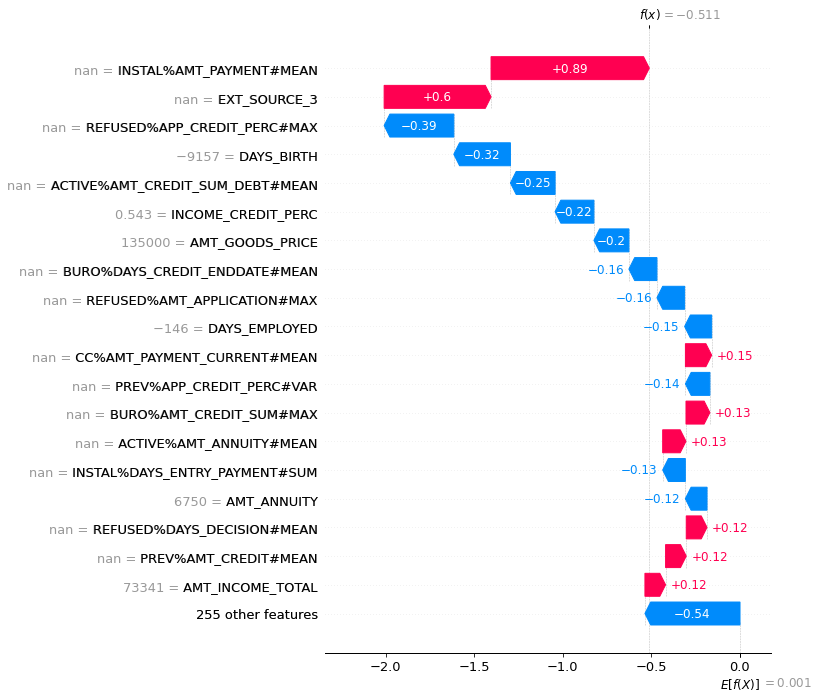

In [689]:
shap_values_0 = explainer(X_sampled[:1])
shap.waterfall_plot(shap_values_0[0], max_display=20)

## N samples dans la population refusée

In [690]:
seuil = 0.80

In [691]:
X_train.index = y_train_pred.index

In [692]:
y_train_pred['TARGET_pred'].shape

(49598,)

In [693]:
X_train.shape

(49598, 274)

In [694]:
X_train.loc[(y_train_pred['TARGET_pred']>seuil)].shape

(3876, 274)

In [695]:
y_test.loc[y_test['TARGET']>seuil].shape

(998, 1)

In [696]:
X_sampled_refused = X_train.loc[(y_train_pred['TARGET_pred']>seuil)].sample(N)

In [697]:
if algo in ['XGBoost', 'XGBoost_weight', 'LightGBM', 'RandomForest']:
    shap_values_refused = explainer.shap_values(X_sampled_refused, check_additivity=False)
elif algo in ['Logistic']:
    shap_values_refused = explainer.shap_values(X_sampled_refused)
else:
    print("*** Algo pas prévu.")    

In [698]:
shap.force_plot(explainer.expected_value, shap_values_refused, X_train)

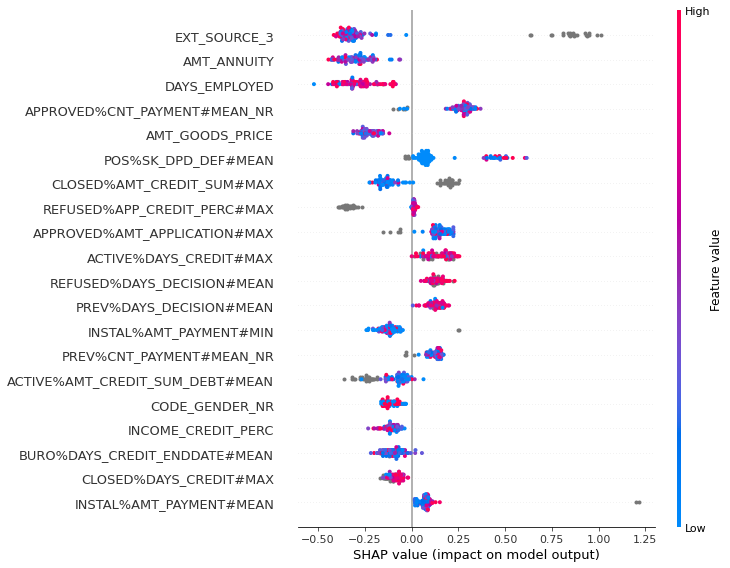

In [699]:
shap.summary_plot(shap_values_refused, X_sampled_refused)

### Un de ces samples

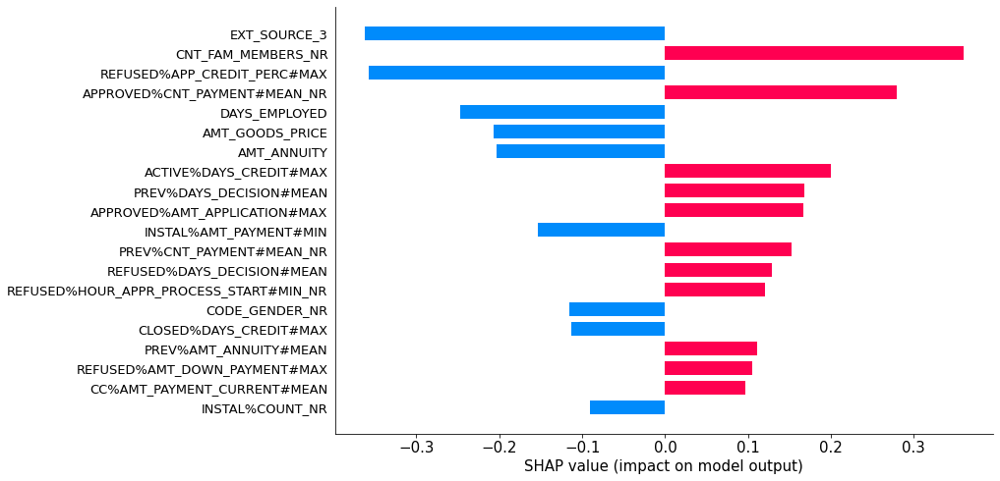

In [700]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
shap.bar_plot(explainer.shap_values(X_sampled_refused)[0],
             feature_names=X_train.columns,
             max_display=20)

In [701]:
s = explainer.shap_values(X_sampled_refused.sample(1))

In [702]:
X_sampled_refused

,CODE_GENDER_NR,FLAG_OWN_CAR_NR,FLAG_OWN_REALTY_NR,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,DAYS_BIRTH,DAYS_EMPLOYED,CNT_FAM_MEMBERS_NR,HOUR_APPR_PROCESS_START_NR,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_3_NR,NAME_CONTRACT_TYPE__Cash loans_NR,NAME_CONTRACT_TYPE__Revolving loans_NR,NAME_TYPE_SUITE__Children_NR,NAME_TYPE_SUITE__Family_NR,NAME_TYPE_SUITE__Group of people_NR,NAME_TYPE_SUITE__Other_A_NR,NAME_TYPE_SUITE__Other_B_NR,"NAME_TYPE_SUITE__Spouse, partner_NR",NAME_TYPE_SUITE__Unaccompanied_NR,NAME_INCOME_TYPE__Businessman_NR,NAME_INCOME_TYPE__Commercial associate_NR,NAME_INCOME_TYPE__Maternity leave_NR,NAME_INCOME_TYPE__Pensioner_NR,NAME_INCOME_TYPE__State servant_NR,NAME_INCOME_TYPE__Student_NR,NAME_INCOME_TYPE__Unemployed_NR,NAME_INCOME_TYPE__Working_NR,NAME_EDUCATION_TYPE__Academic degree_NR,NAME_EDUCATION_TYPE__Higher education_NR,NAME_EDUCATION_TYPE__Incomplete higher_NR,NAME_EDUCATION_TYPE__Lower secondary_NR,NAME_EDUCATION_TYPE__Secondary / secondary special_NR,NAME_FAMILY_STATUS__Civil marriage_NR,NAME_FAMILY_STATUS__Married_NR,NAME_FAMILY_STATUS__Separated_NR,NAME_FAMILY_STATUS__Single / not married_NR,NAME_FAMILY_STATUS__Unknown_NR,NAME_FAMILY_STATUS__Widow_NR,OCCUPATION_TYPE__Accountants_NR,OCCUPATION_TYPE__Cleaning staff_NR,OCCUPATION_TYPE__Cooking staff_NR,OCCUPATION_TYPE__Core staff_NR,OCCUPATION_TYPE__Drivers_NR,OCCUPATION_TYPE__HR staff_NR,OCCUPATION_TYPE__High skill tech staff_NR,OCCUPATION_TYPE__IT staff_NR,OCCUPATION_TYPE__Laborers_NR,OCCUPATION_TYPE__Low-skill Laborers_NR,OCCUPATION_TYPE__Managers_NR,OCCUPATION_TYPE__Medicine staff_NR,OCCUPATION_TYPE__Private service staff_NR,OCCUPATION_TYPE__Realty agents_NR,OCCUPATION_TYPE__Sales staff_NR,OCCUPATION_TYPE__Secretaries_NR,OCCUPATION_TYPE__Security staff_NR,OCCUPATION_TYPE__Waiters/barmen staff_NR,WEEKDAY_APPR_PROCESS_START__FRIDAY_NR,WEEKDAY_APPR_PROCESS_START__MONDAY_NR,WEEKDAY_APPR_PROCESS_START__SATURDAY_NR,WEEKDAY_APPR_PROCESS_START__SUNDAY_NR,WEEKDAY_APPR_PROCESS_START__THURSDAY_NR,WEEKDAY_APPR_PROCESS_START__TUESDAY_NR,WEEKDAY_APPR_PROCESS_START__WEDNESDAY_NR,ORGANIZATION_TYPE__Advertising_NR,ORGANIZATION_TYPE__Agriculture_NR,ORGANIZATION_TYPE__Bank_NR,ORGANIZATION_TYPE__Business Entity Type 1_NR,ORGANIZATION_TYPE__Business Entity Type 2_NR,ORGANIZATION_TYPE__Business Entity Type 3_NR,ORGANIZATION_TYPE__Cleaning_NR,ORGANIZATION_TYPE__Construction_NR,...,PREV%AMT_CREDIT#MEAN,PREV%AMT_DOWN_PAYMENT#MAX,PREV%AMT_GOODS_PRICE#MEAN,PREV%HOUR_APPR_PROCESS_START#MIN_NR,PREV%HOUR_APPR_PROCESS_START#MAX_NR,PREV%HOUR_APPR_PROCESS_START#MEAN_NR,PREV%RATE_DOWN_PAYMENT#MEAN,PREV%DAYS_DECISION#MEAN,PREV%CNT_PAYMENT#MEAN_NR,PREV%APP_CREDIT_PERC#MIN,PREV%APP_CREDIT_PERC#MAX,PREV%APP_CREDIT_PERC#MEAN,PREV%APP_CREDIT_PERC#VAR,APPROVED%AMT_ANNUITY#MEAN,APPROVED%AMT_APPLICATION#MAX,APPROVED%AMT_CREDIT#MEAN,APPROVED%AMT_DOWN_PAYMENT#MAX,APPROVED%AMT_GOODS_PRICE#MEAN,APPROVED%HOUR_APPR_PROCESS_START#MIN_NR,APPROVED%HOUR_APPR_PROCESS_START#MAX_NR,APPROVED%HOUR_APPR_PROCESS_START#MEAN_NR,APPROVED%RATE_DOWN_PAYMENT#MEAN,APPROVED%DAYS_DECISION#MEAN,APPROVED%CNT_PAYMENT#MEAN_NR,APPROVED%APP_CREDIT_PERC#MIN,APPROVED%APP_CREDIT_PERC#MAX,APPROVED%APP_CREDIT_PERC#MEAN,APPROVED%APP_CREDIT_PERC#VAR,REFUSED%AMT_ANNUITY#MEAN,REFUSED%AMT_APPLICATION#MAX,REFUSED%AMT_CREDIT#MEAN,REFUSED%AMT_DOWN_PAYMENT#MAX,REFUSED%AMT_GOODS_PRICE#MEAN,REFUSED%HOUR_APPR_PROCESS_START#MIN_NR,REFUSED%HOUR_APPR_PROCESS_START#MAX_NR,REFUSED%HOUR_APPR_PROCESS_START#MEAN_NR,REFUSED%RATE_DOWN_PAYMENT#MEAN,REFUSED%DAYS_DECISION#MEAN,REFUSED%CNT_PAYMENT#MEAN_NR,REFUSED%APP_CREDIT_PERC#MIN,REFUSED%APP_CREDIT_PERC#MAX,REFUSED%APP_CREDIT_PERC#MEAN,REFUSED%APP_CREDIT_PERC#VAR,POS%MONTHS_BALANCE#SIZE_NR,POS%SK_DPD_DEF#MEAN,POS%SK_DPD_DEF#MAX,POS%COUNT_NR,INSTAL%AMT_PAYMENT#MIN,INSTAL%AMT_PAYMENT#MAX,INSTAL%AMT_PAYMENT#MEAN,INSTAL%AMT_PAYMENT#VAR,INSTAL%AMT_PAYMENT#SUM,INSTAL%DAYS_ENTRY_PAYMENT#SUM,INSTAL%COUNT_NR,CC%AMT_DRAWINGS_ATM_CURRENT#MEAN,CC%SK_DPD_DEF#MEAN,CC%SK_DPD_DEF#MAX,CC%AMT_RECEIVABLE_PRI

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


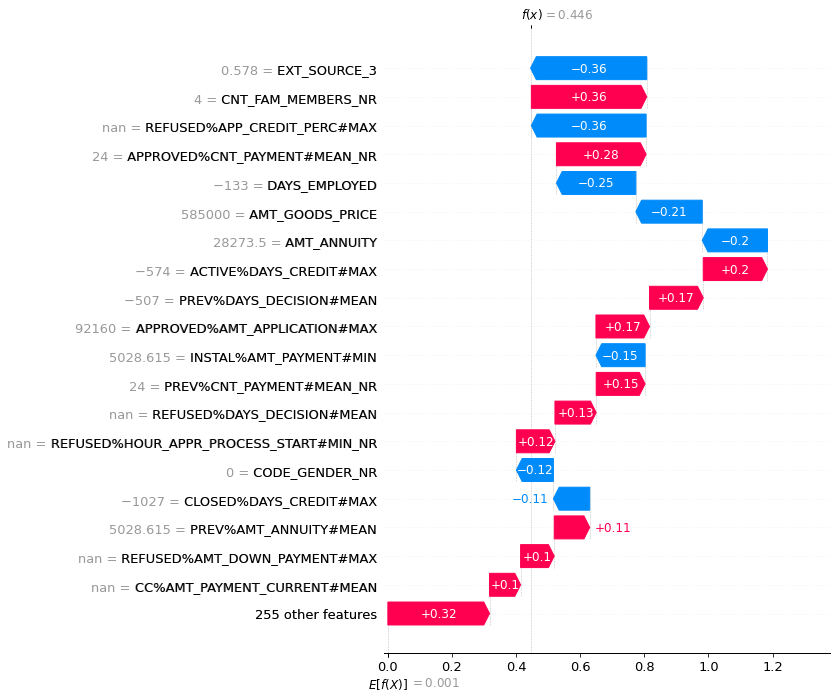

In [703]:
shap_values_refused_0 = explainer(X_sampled_refused[:1])
shap.waterfall_plot(shap_values_refused_0[0], max_display=20) # Ne fonctionne pas

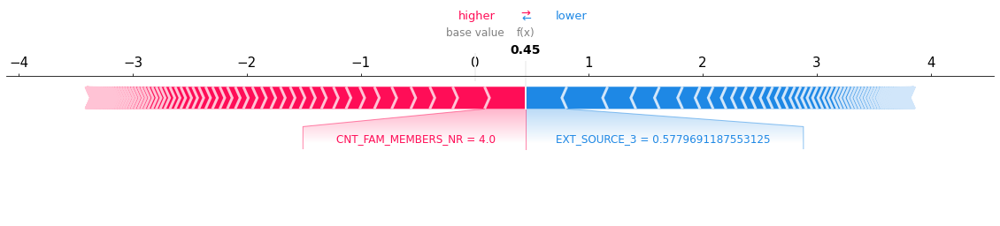

In [704]:
shap.force_plot(explainer.expected_value, shap_values_refused[0,:], X_sampled_refused.iloc[0,:], matplotlib=True)

## N samples dans la population acceptée

In [705]:
seuil_acc = 0.80

In [706]:
X_sampled_accepted = X_train.loc[(y_train_pred['TARGET_pred']<seuil_acc)].sample(N, random_state=31051996)

In [707]:
if algo in ['XGBoost','LightGBM','RandomForest']:
    shap_values_accepted = explainer.shap_values(X_sampled_accepted, check_additivity=False)
elif algo in ['Logistic']:
    shap_values_accepted = explainer.shap_values(X_sampled_accepted)
else:
    print("*** Algo pas prévu.")

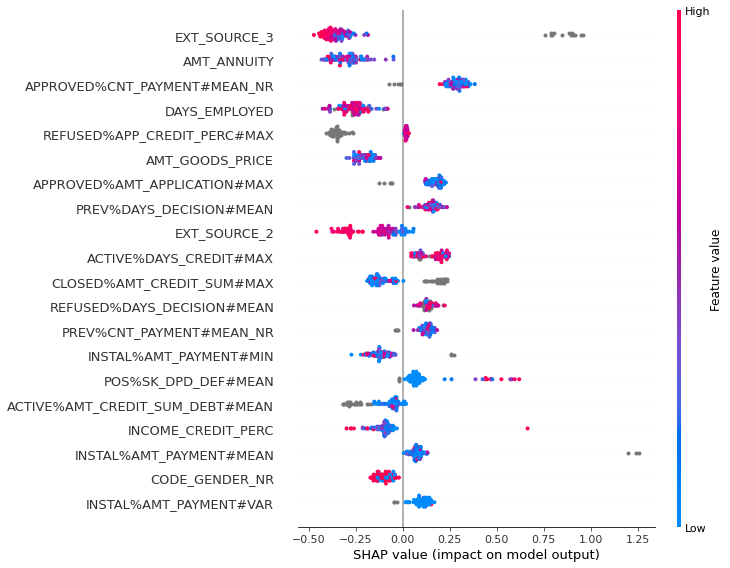

In [708]:
shap.summary_plot(shap_values_accepted, X_sampled_accepted)

### Un de ces samples

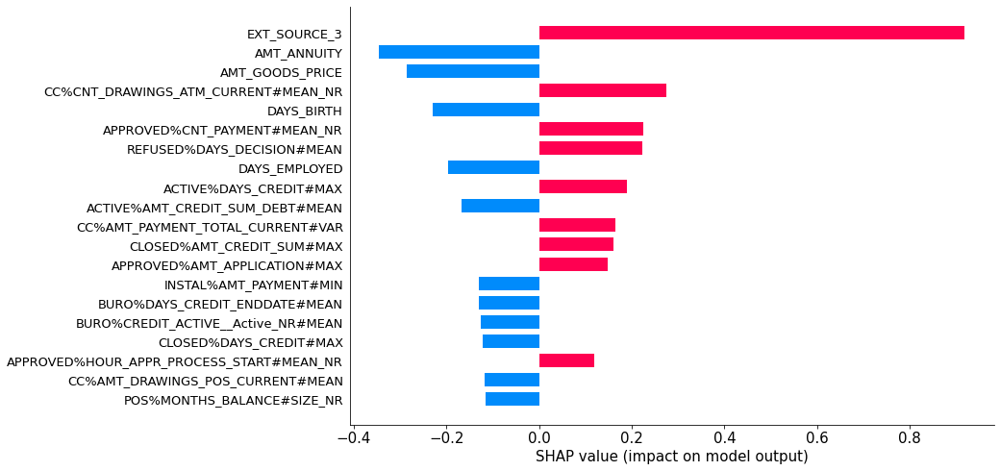

In [709]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
shap.bar_plot(explainer.shap_values(X_sampled_accepted)[0],
             feature_names=X_train.columns,
             max_display=20)

In [710]:
X_train.loc[X_sampled_accepted.index[0]]

CODE_GENDER_NR                         0.000000e+00
FLAG_OWN_CAR_NR                        0.000000e+00
FLAG_OWN_REALTY_NR                     0.000000e+00
AMT_INCOME_TOTAL                       1.125000e+05
AMT_CREDIT                             5.390595e+05
                                           ...     
CC%CNT_DRAWINGS_ATM_CURRENT#MEAN_NR    1.466667e+00
CC%AMT_PAYMENT_TOTAL_CURRENT#MEAN      9.439500e+03
CC%AMT_PAYMENT_TOTAL_CURRENT#VAR       1.675419e+07
CC%COUNT_NR                            1.500000e+01
CNT_PAYMENT_NR                         1.800000e+01
Name: 48381, Length: 274, dtype: float64

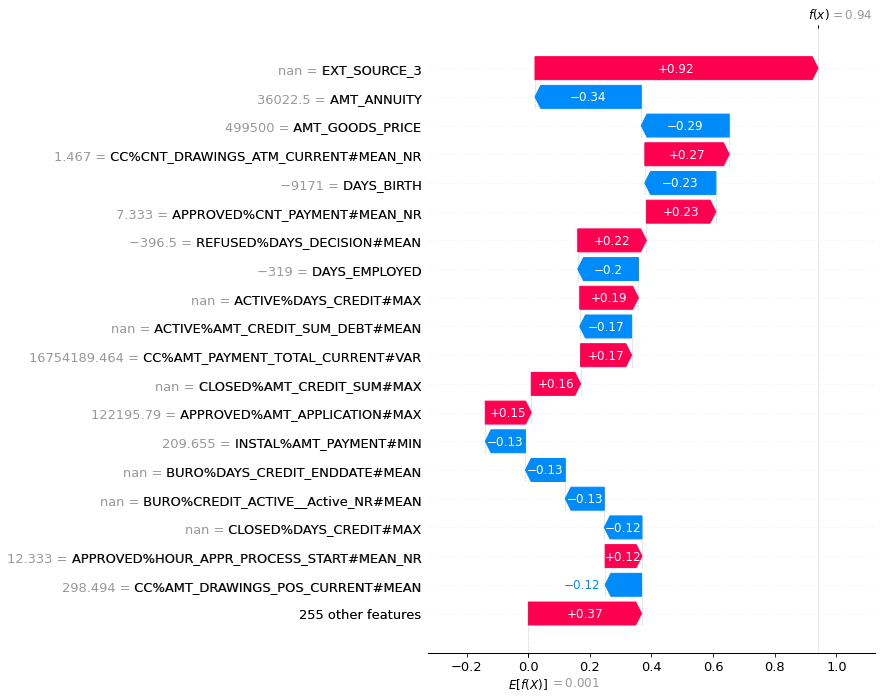

In [711]:
shap_values_accepted_0 = explainer(X_sampled_accepted[:1])
shap.waterfall_plot(shap_values_accepted_0[0], max_display=20) # Ne fonctionne pas

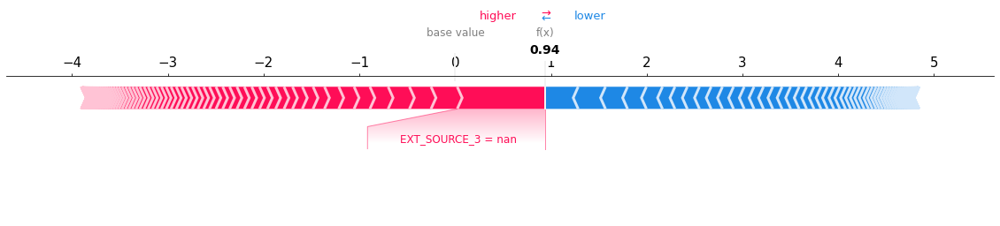

In [712]:
shap.force_plot(explainer.expected_value, shap_values_accepted[0,:], X_sampled_accepted.iloc[0,:], matplotlib=True)

# Export du modèle et données pour le dashboard

In [713]:
import pickle

In [714]:
api_dir = '../flaskapi'

In [715]:
with open(f'{api_dir}/pipeline.pkl', 'wb') as output:
    pickle.dump(pipeline, output, pickle.HIGHEST_PROTOCOL)

In [716]:
# import joblib
# joblib.dump(pipeline, f"{api_dir}/pipeline.pkl")

In [717]:
# test_df_nonan.drop(['TARGET'], axis=1, inplace=True)

In [718]:
'FLAG_OWN_REALTY_NR' in test_df.columns

True

In [719]:
with open(f'{api_dir}/test_df_all_nan.pkl', 'wb') as output:
    pickle.dump(test_df, output, pickle.HIGHEST_PROTOCOL)

In [720]:
risk_threshold

0.8

In [721]:
model_params = {}
model_params['threshold'] = risk_threshold

In [722]:
with open(f'{api_dir}/model_params.pkl', 'wb') as output:
    pickle.dump(model_params, output, pickle.HIGHEST_PROTOCOL)

In [723]:
with open(f'{api_dir}/explainer.pkl', 'wb') as output:
    pickle.dump(explainer, output, pickle.HIGHEST_PROTOCOL)